In [2]:
from lime import lime_tabular
import pickle
import pandas as pd
import pandas_profiling
from gc import collect
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, f1_score
from sklearn.model_selection import RandomizedSearchCV
import lightgbm as lgb
from sklearn.preprocessing import normalize
from sklearn.cross_validation import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
import hdbscan
from graphviz import Source
from IPython.display import SVG
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.feature_selection import RFE

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [3]:
%matplotlib inline

In [4]:
df = pd.read_csv('bases_full.csv')

In [5]:
df = df.drop(['Y', 'Estado_Civil_Sexo'], axis=1)

In [6]:
pandas_profiling.ProfileReport(df)

Number of variables,54
Number of observations,768
Total Missing (%),0.0%
Total size in memory,324.1 KiB
Average record size in memory,432.1 B
Numeric,41
Categorical,12
Date,0
Text (Unique),1
Rejected,0
Distinct count,2


In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
nEntidades_competencia,768.0,2.175781,1.883597,0.000000,1.000000,2.000000,3.000000,6.000000
nDesem_ult_semana,768.0,0.314721,0.091171,0.075777,0.250915,0.307212,0.375252,0.616374
nPorcentaje_cero_cuotas_ope,768.0,0.004625,0.009467,0.000000,0.000000,0.000000,0.005479,0.147927
nPorcentaje_sal_cero_cuo,768.0,0.003924,0.011979,0.000000,0.000000,0.000000,0.002600,0.177580
nvarsaldocapital,768.0,0.081673,0.754621,-0.171438,-0.000922,0.011757,0.030725,17.783852
nporcentaje_Herencia,768.0,0.186376,0.190662,0.000000,0.030528,0.124826,0.295961,0.814870
nOperaciones,768.0,23.756510,4.978895,8.000000,21.000000,23.000000,26.000000,50.000000
nRatio_crec_deuda,768.0,1.651558,3.424816,0.000000,0.840066,0.956156,1.357241,47.431760
Edad,768.0,32.765625,5.802015,21.000000,29.000000,32.000000,36.000000,59.000000
nProductividad,768.0,0.959909,0.184230,0.250000,0.827586,0.956562,1.051121,1.720000


In [6]:
dtypes = ['category', 'bool', 'object']
df_categorical = df.loc[:, [col for col in df.columns]].select_dtypes(include=dtypes)
df_categorical.head()
df_categorical.shape
list(df_categorical)

,cod_ide,Cargo,cero_cuotas,Amonestacion,nAmonestacion_suspension,herencia,nProbMoraNoHeredada,nProbMoraHeredada,Clasificacion_Asesor_Urb_Rur,Genero,EstadoCivil,nProductividad_dic,ingresoef
0,C00000001,ASESOR COMERCIAL FUNCIONARIO,si,no,no,si,bueno,malo,U,Masculino,Soltero,bueno,NO
1,C00000002,ASESOR COMERCIAL MASTER,si,no,no,si,malo,malo,U,Femenino,Otros,bueno,NO
2,C00000003,ASESOR COMERCIAL MASTER,si,no,no,si,malo,bueno,U,Femenino,Casado,bueno,NO
3,C00000004,ASESOR COMERCIAL FUNCIONARIO,si,no,no,si,bueno,malo,U,Femenino,Soltero,bueno,NO
4,C00000005,ASESOR COMERCIAL FUNCIONARIO,no,no,no,si,malo,bueno,U,Femenino,Soltero,bueno,NO


(768, 13)

['cod_ide',
 'Cargo',
 'cero_cuotas',
 'Amonestacion',
 'nAmonestacion_suspension',
 'herencia',
 'nProbMoraNoHeredada',
 'nProbMoraHeredada',
 'Clasificacion_Asesor_Urb_Rur',
 'Genero',
 'EstadoCivil',
 'nProductividad_dic',
 'ingresoef']

In [7]:
df = pd.get_dummies(df, columns=['Cargo', 'Genero', 'EstadoCivil', 'Clasificacion_Asesor_Urb_Rur'], prefix='D_')

for feature in ['nProbMoraNoHeredada', 'nProbMoraHeredada', 'nProductividad_dic']:
    df.loc[:, feature] = df.loc[:, feature].map({ 'bueno': 1, 'malo': 0 })
    
for feature in ['cero_cuotas', 'Amonestacion', 'nAmonestacion_suspension', 'herencia']:
    df.loc[:, feature] = df.loc[:, feature].map({ 'si': 1, 'no': 0 })
    
df.loc[:, 'ingresoef'] = df.loc[:, 'ingresoef'].map({ 'SI': 1, 'NO': 0 })

df_categorical = df.loc[:, [col for col in list(df) if 
                            col in list(df_categorical) or 
                            col.startswith('D_') or
                            col.startswith('pregunta')]]

for feature in list(df_categorical):
    if feature != 'cod_ide' and not feature.startswith('pregunta'):
        df[feature].value_counts()

1    514
0    254
Name: cero_cuotas, dtype: int64

0    721
1     47
Name: Amonestacion, dtype: int64

0    574
1    194
Name: nAmonestacion_suspension, dtype: int64

1    723
0     45
Name: herencia, dtype: int64

0    417
1    351
Name: nProbMoraNoHeredada, dtype: int64

1    402
0    366
Name: nProbMoraHeredada, dtype: int64

1    731
0     37
Name: nProductividad_dic, dtype: int64

0    584
1    184
Name: ingresoef, dtype: int64

0    707
1     61
Name: D__ASESOR COMERCIAL FUNCIONARIO, dtype: int64

0    611
1    157
Name: D__ASESOR COMERCIAL JUNIOR 1, dtype: int64

0    528
1    240
Name: D__ASESOR COMERCIAL JUNIOR 2, dtype: int64

0    637
1    131
Name: D__ASESOR COMERCIAL MASTER, dtype: int64

0    589
1    179
Name: D__ASESOR COMERCIAL SENIOR, dtype: int64

0    530
1    238
Name: D__Femenino, dtype: int64

1    530
0    238
Name: D__Masculino, dtype: int64

0    621
1    147
Name: D__Casado, dtype: int64

0    676
1     92
Name: D__Otros, dtype: int64

1    529
0    239
Name: D__Soltero, dtype: int64

0    607
1    161
Name: D__R, dtype: int64

1    607
0    161
Name: D__U, dtype: int64

In [8]:
dtypes = ['number']
df_numeric = df.loc[:, [col for col in df.columns if col not in df_categorical.columns]].select_dtypes(include=dtypes)
df_numeric.head()
df_numeric.shape
list(df_numeric)

,nEntidades_competencia,nDesem_ult_semana,nPorcentaje_cero_cuotas_ope,nPorcentaje_sal_cero_cuo,nvarsaldocapital,nporcentaje_Herencia,nOperaciones,nRatio_crec_deuda,Edad,nProductividad,antiguedad
0,1,0.256354,0.000000,0.000000,0.013561,0.380552,20,0.880677,36,0.823077,116
1,0,0.406922,0.001969,0.000141,0.042866,0.444054,24,2.061512,46,0.750000,16
2,5,0.321911,0.000000,0.000000,-0.005801,0.020612,22,0.668892,58,0.827303,140
3,3,0.294114,0.008791,0.015452,0.018111,0.300313,26,0.722767,34,1.100000,10
4,2,0.315331,0.000000,0.000000,0.004865,0.151475,26,0.000000,36,0.906250,119


(768, 11)

['nEntidades_competencia',
 'nDesem_ult_semana',
 'nPorcentaje_cero_cuotas_ope',
 'nPorcentaje_sal_cero_cuo',
 'nvarsaldocapital',
 'nporcentaje_Herencia',
 'nOperaciones',
 'nRatio_crec_deuda',
 'Edad',
 'nProductividad',
 'antiguedad']

In [9]:
df_discrete = df.loc[:, [col for col in df_numeric.columns if (df[col].dropna() - df[col].dropna().astype(int) == 0).all()]]
df_discrete.head()
df_discrete.shape
list(df_discrete)

,nEntidades_competencia,nOperaciones,Edad,antiguedad
0,1,20,36,116
1,0,24,46,16
2,5,22,58,140
3,3,26,34,10
4,2,26,36,119


(768, 4)

['nEntidades_competencia', 'nOperaciones', 'Edad', 'antiguedad']

In [10]:
df_continuous = df.loc[:, [col for col in df_numeric.columns if col not in df_discrete]]
df_continuous.head()
df_continuous.shape
list(df_continuous)

,nDesem_ult_semana,nPorcentaje_cero_cuotas_ope,nPorcentaje_sal_cero_cuo,nvarsaldocapital,nporcentaje_Herencia,nRatio_crec_deuda,nProductividad
0,0.256354,0.000000,0.000000,0.013561,0.380552,0.880677,0.823077
1,0.406922,0.001969,0.000141,0.042866,0.444054,2.061512,0.750000
2,0.321911,0.000000,0.000000,-0.005801,0.020612,0.668892,0.827303
3,0.294114,0.008791,0.015452,0.018111,0.300313,0.722767,1.100000
4,0.315331,0.000000,0.000000,0.004865,0.151475,0.000000,0.906250


(768, 7)

['nDesem_ult_semana',
 'nPorcentaje_cero_cuotas_ope',
 'nPorcentaje_sal_cero_cuo',
 'nvarsaldocapital',
 'nporcentaje_Herencia',
 'nRatio_crec_deuda',
 'nProductividad']

## Correlations

In [11]:
def make_correlation_graphic(df, title):
    corr = df.corr()
    
    # Generate a mask for the upper triangle
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(15, 15))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    
    ax.set_title(title)
    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})

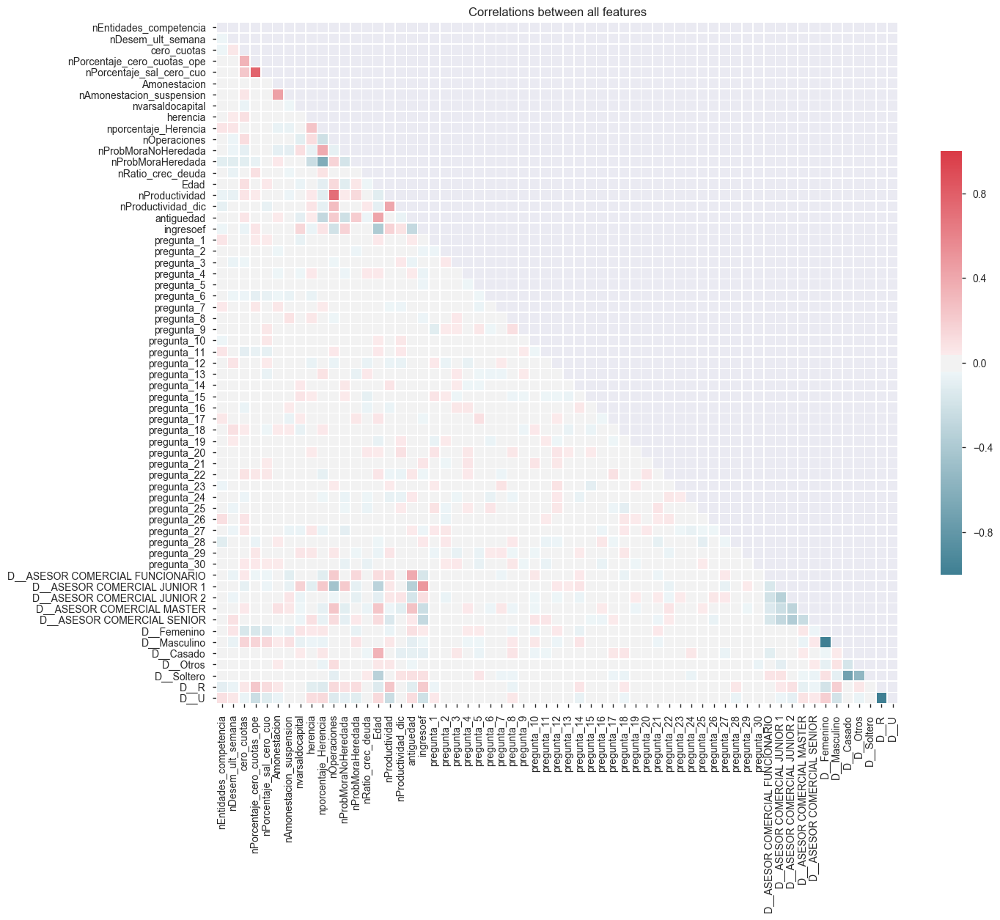

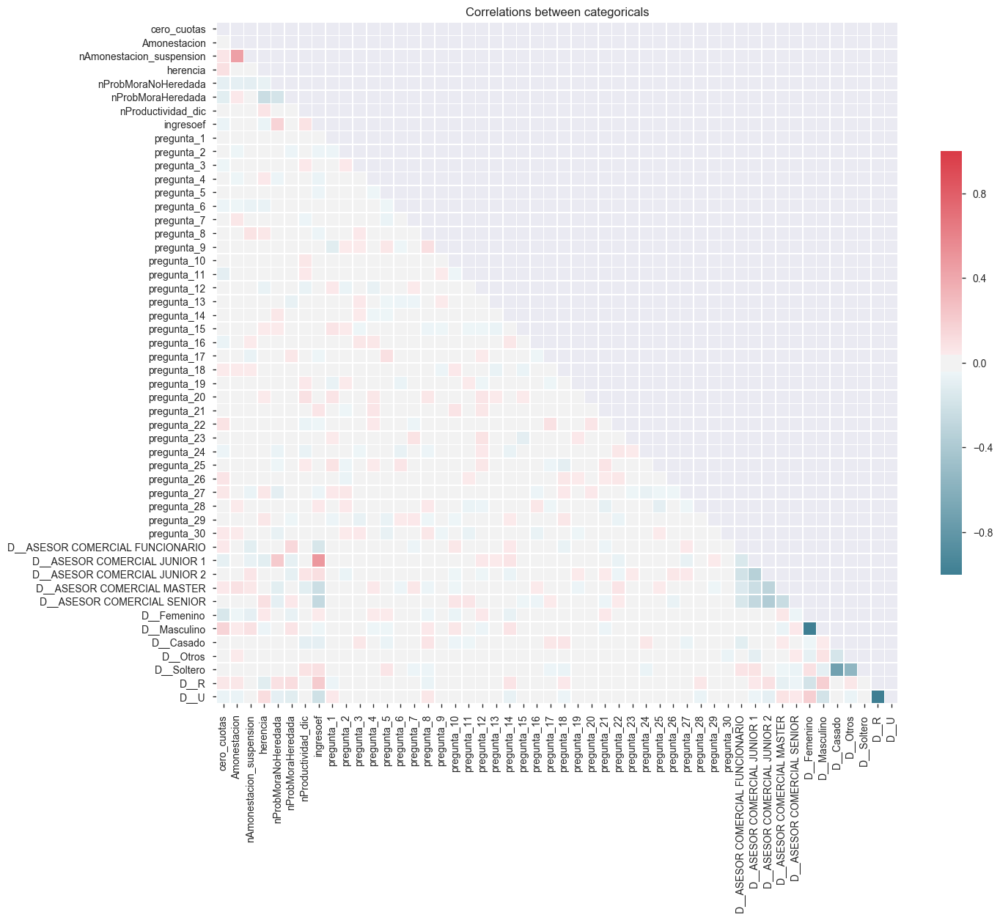

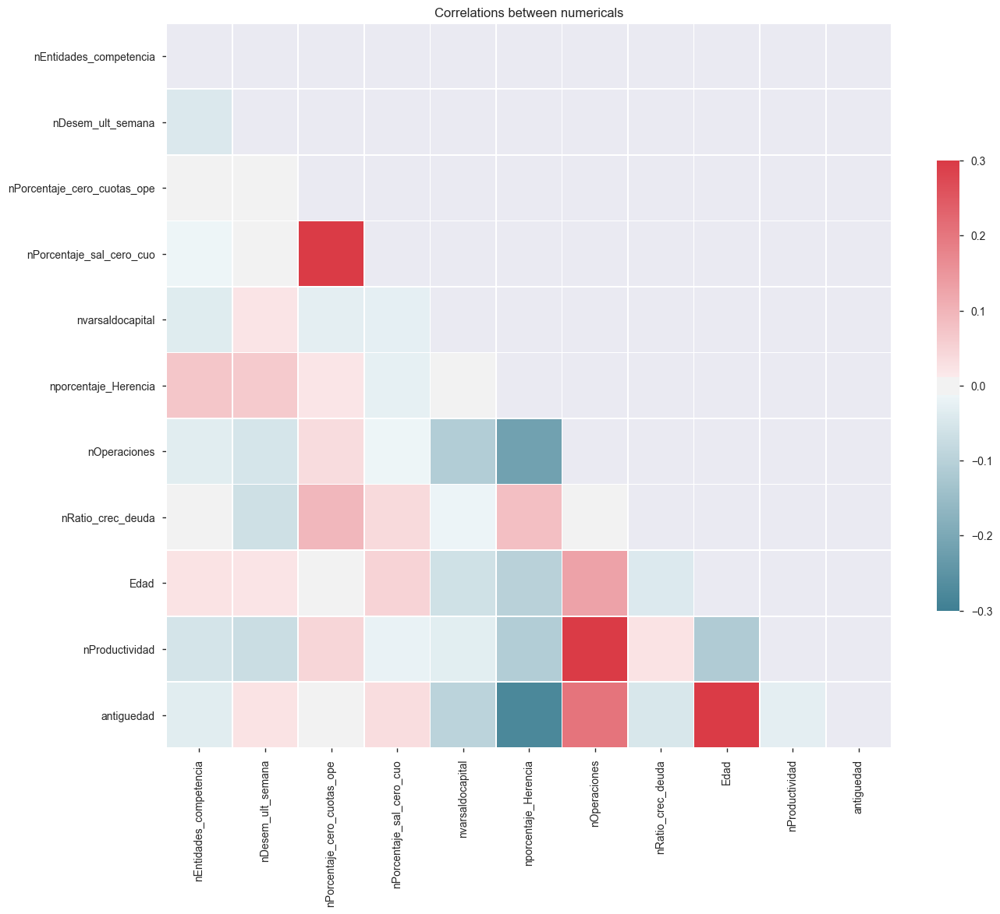

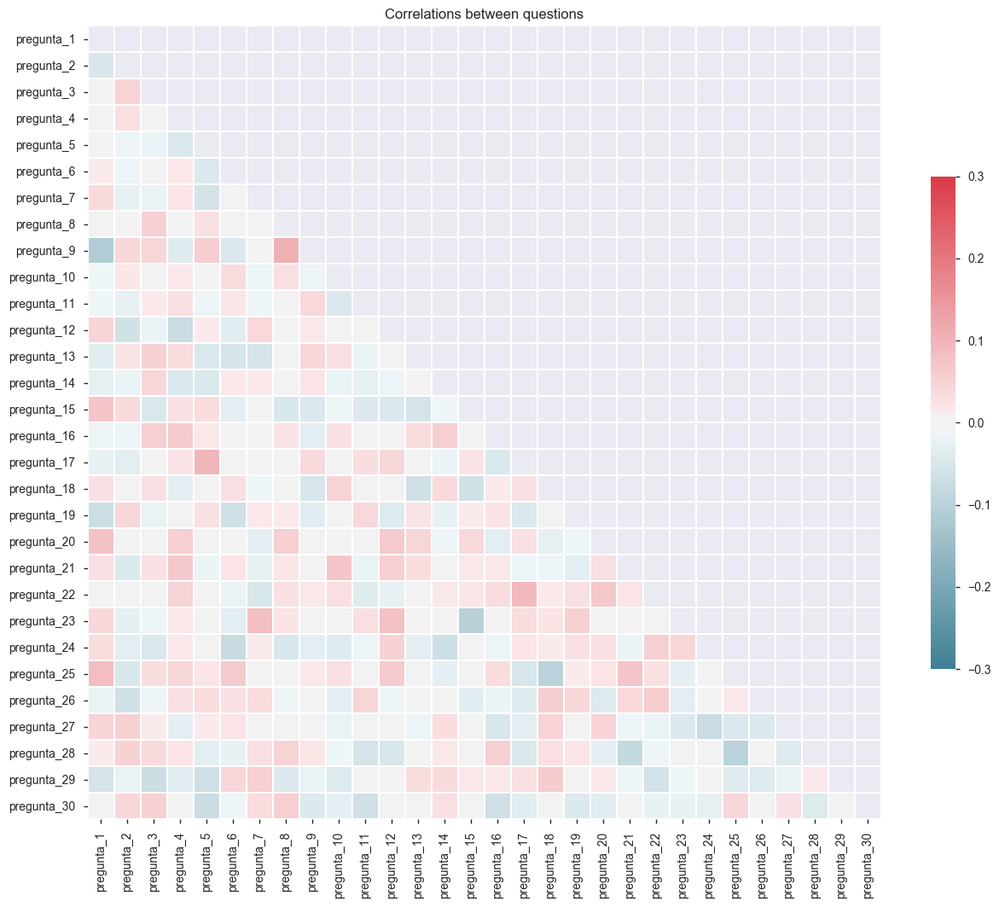

In [12]:
make_correlation_graphic(df, 'Correlations between all features')
make_correlation_graphic(df_categorical, 'Correlations between categoricals')
make_correlation_graphic(df_numeric, 'Correlations between numericals')

df_questions = df_categorical.loc[:, [col for col in df_categorical.columns if col.startswith('pregunta')]]
make_correlation_graphic(df_questions, 'Correlations between questions')

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


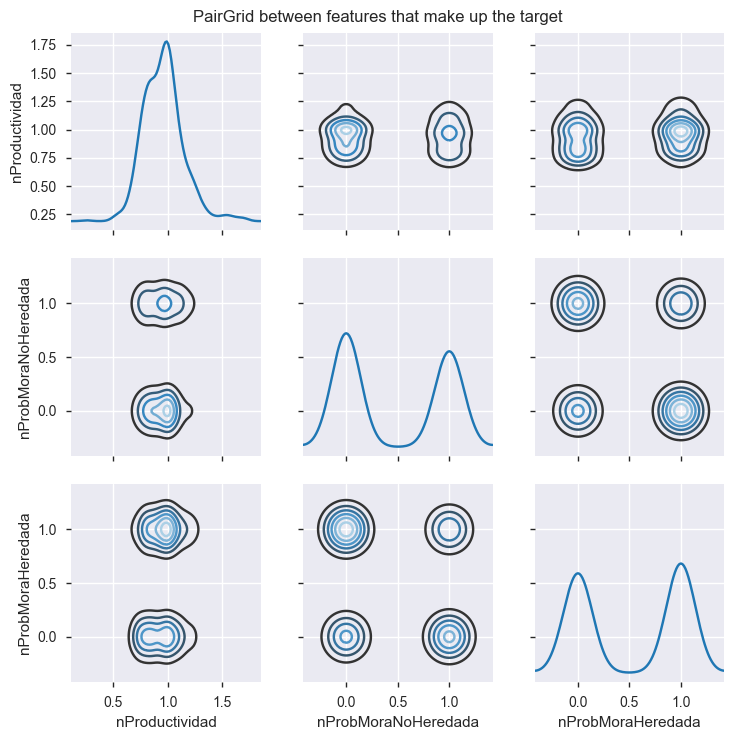

In [13]:
g = sns.PairGrid(df[['nProductividad', 'nProbMoraNoHeredada', 'nProbMoraHeredada']])
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.kdeplot, cmap="Blues_d", n_levels=6)
plt.subplots_adjust(top=0.95)
g.fig.suptitle('PairGrid between features that make up the target')

In [14]:
df['PM'] = df['nProbMoraHeredada'] + df['nProbMoraNoHeredada']

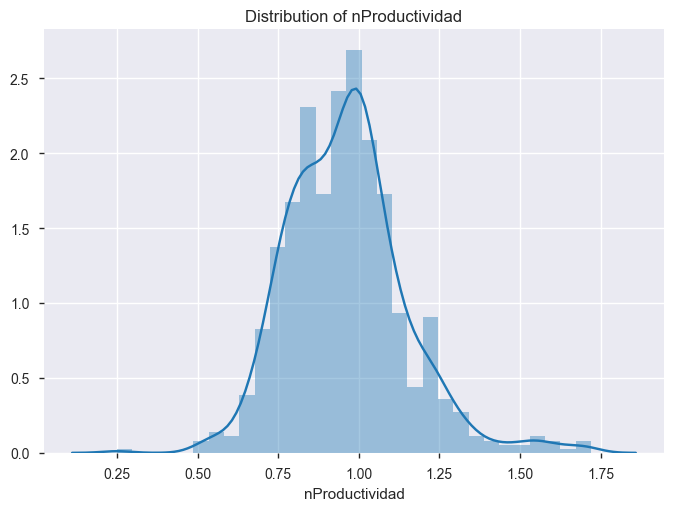

In [15]:
g = sns.distplot(df['nProductividad'])
g.set_title('Distribution of nProductividad')

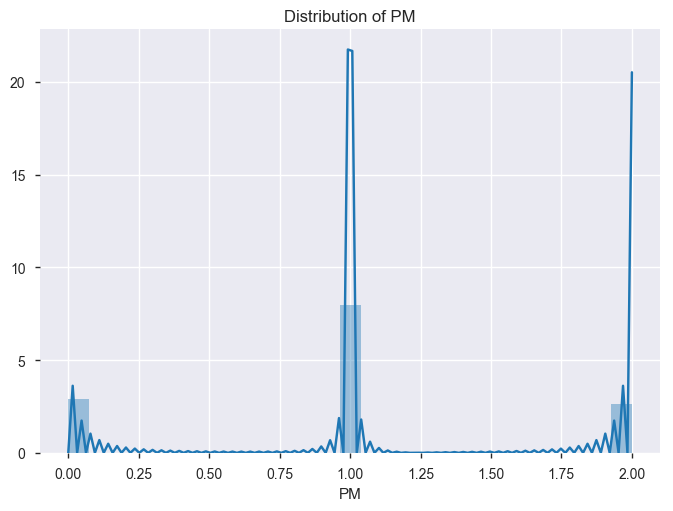

In [16]:
g = sns.distplot(df['PM'])
g.set_title('Distribution of PM')

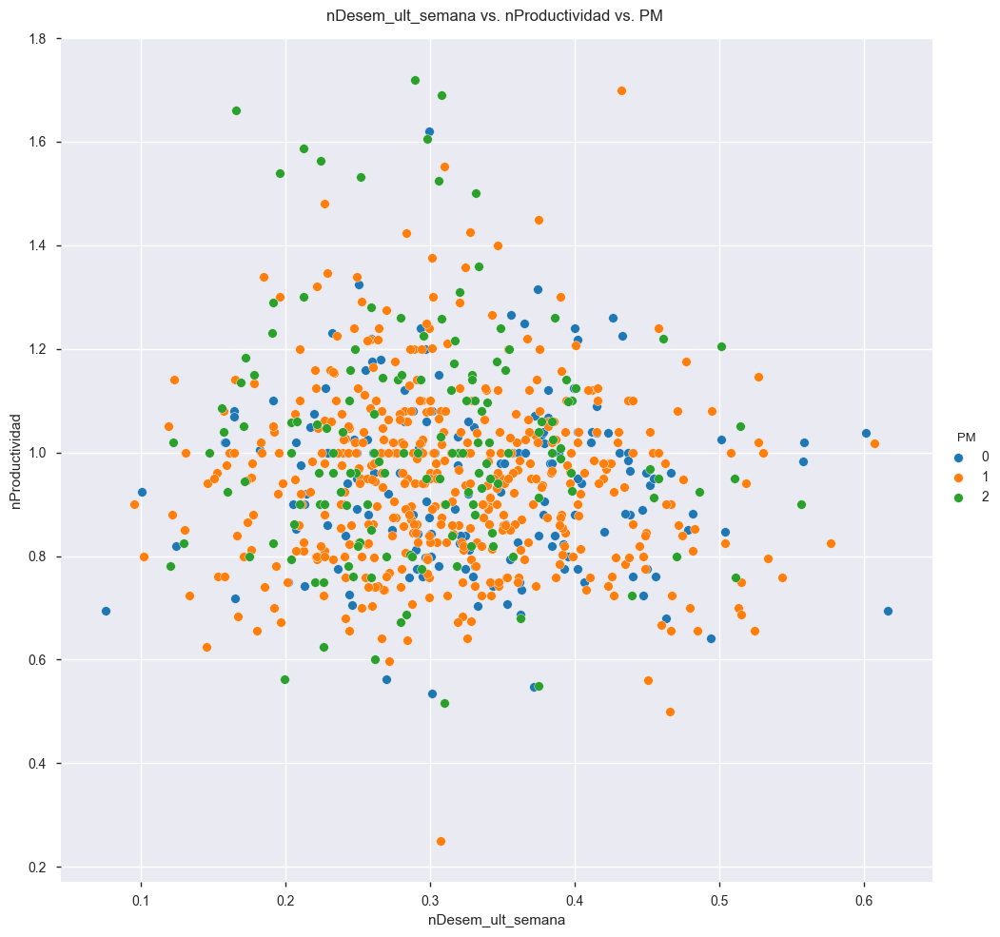

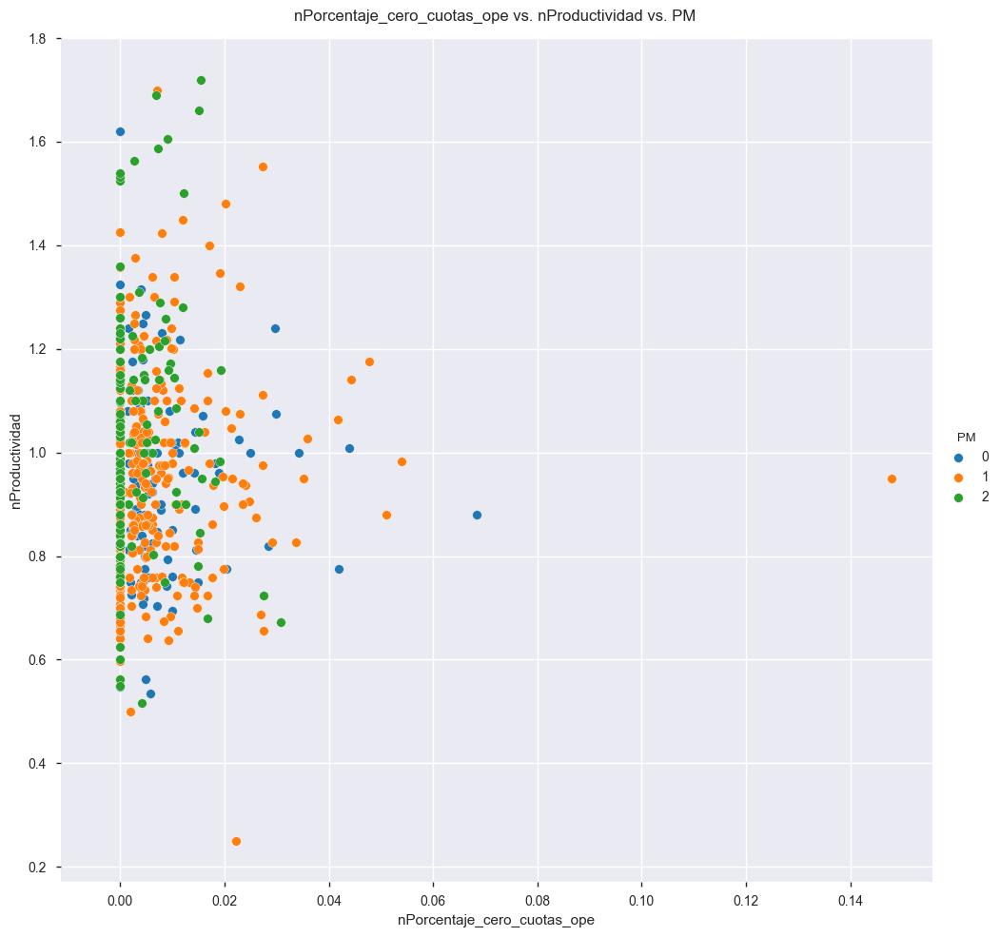

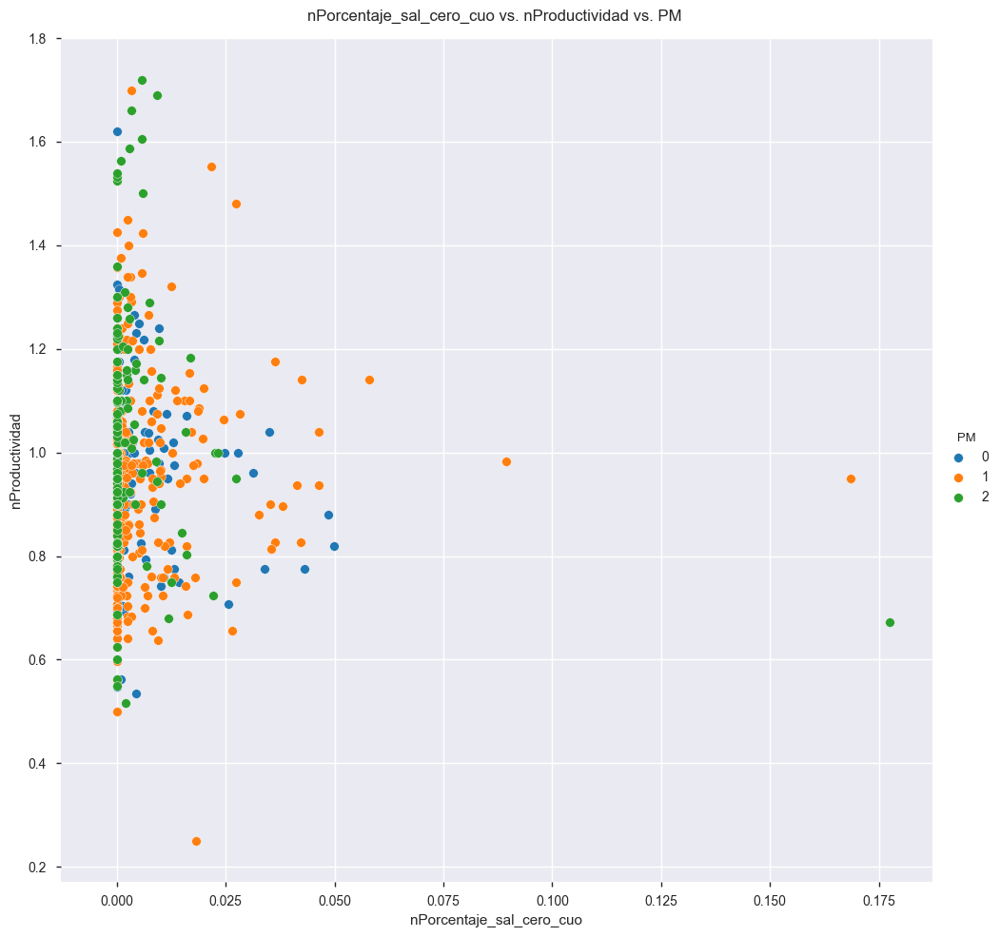

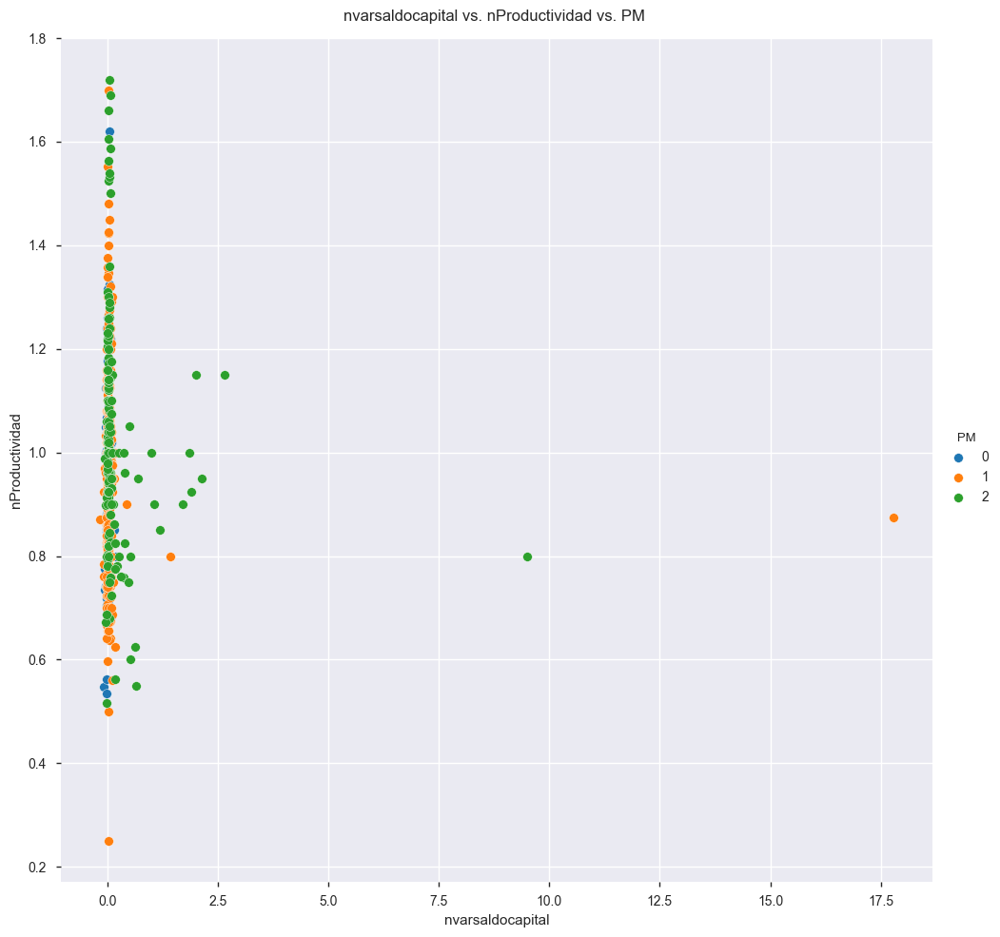

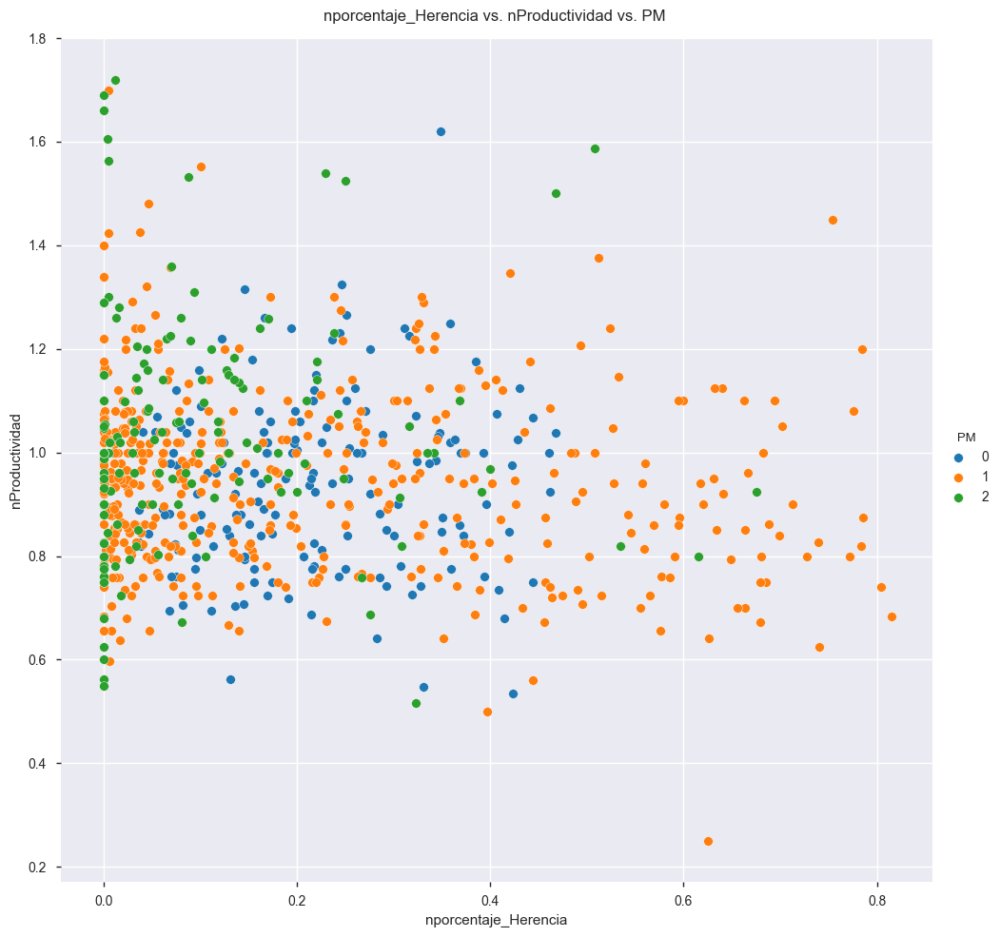

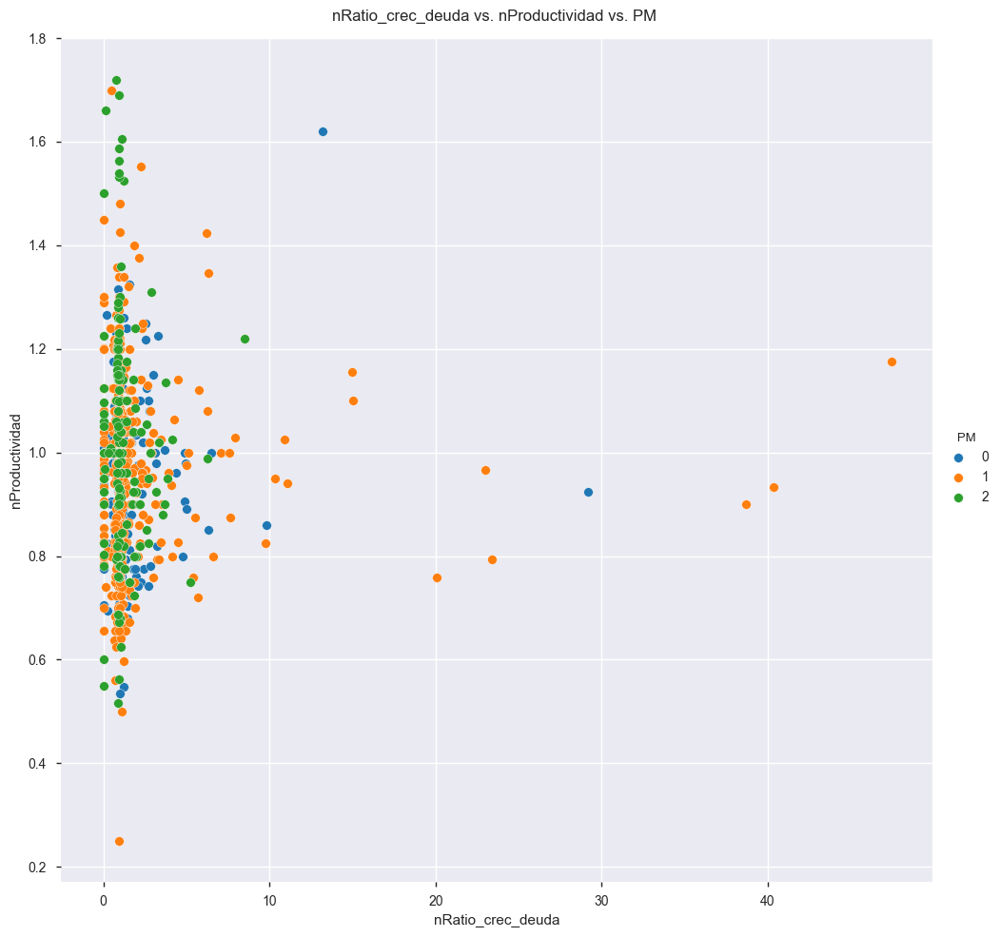

In [17]:
pair_vars = list(df_continuous)
pair_vars.remove('nProductividad')
for feature in pair_vars:
    plt.figure()
    g = sns.pairplot(df, x_vars=[feature], y_vars=["nProductividad"], hue="PM", size=10, aspect=1)
    plt.subplots_adjust(top=0.95)
    g.fig.suptitle('{} vs. nProductividad vs. PM'.format(feature))

# Creating target

In [18]:
df['PM'].value_counts()

1    455
0    164
2    149
Name: PM, dtype: int64

In [19]:
def convert_score(el):
    return 1/(el + 1)

In [20]:
df.loc[:, 'PM'] = df.loc[:, 'PM'].apply(convert_score)

In [21]:
df['PM'].value_counts()

0.500000    455
1.000000    164
0.333333    149
Name: PM, dtype: int64

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


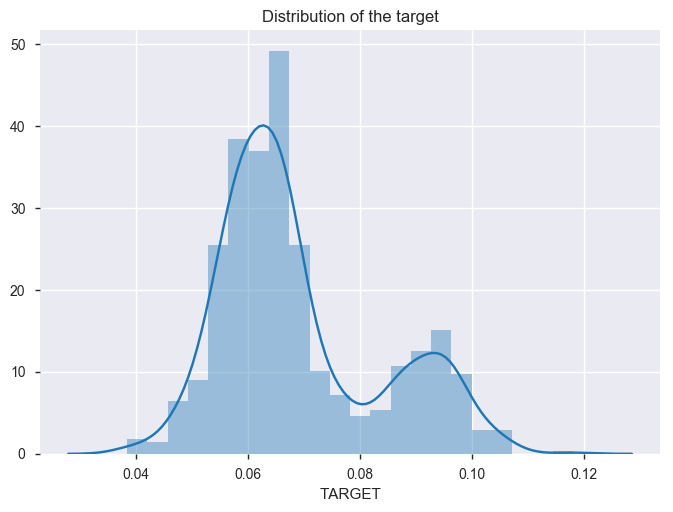

In [22]:
df['N_nProductividad'] = normalize(df['nProductividad'])[0]
df['N_PM'] = normalize(df['PM'])[0]
df['TARGET'] = df['N_nProductividad'] + df['N_PM']
g = sns.distplot(df['TARGET'])
g.set_title('Distribution of the target')

In [23]:
df = df.drop(['PM', 'N_nProductividad', 'N_PM', 'nProductividad', 'nProbMoraHeredada', 'nProbMoraNoHeredada'], axis=1)

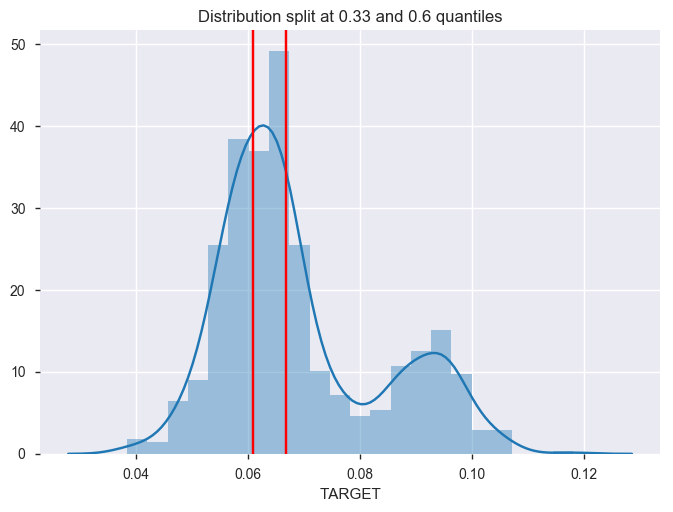

In [24]:
margin1 = 0.33
margin2 = 0.60

g = sns.distplot(df['TARGET'])
g.set_title('Distribution split at {} and {} quantiles'.format(margin1, margin2))
sns.plt.axvline(df['TARGET'].quantile(margin1), color='r')
sns.plt.axvline(df['TARGET'].quantile(margin2), color='r')

plt.show()

In [25]:
df[['cod_ide', 'TARGET']].head()

,cod_ide,TARGET
0,C00000001,0.059532
1,C00000002,0.085980
2,C00000003,0.059688
3,C00000004,0.069756
4,C00000005,0.062603


In [26]:
categories = ['bad', 'normal', 'good']
cuts = [min(df['TARGET']), df['TARGET'].quantile(margin1), df['TARGET'].quantile(margin2), max(df['TARGET'])]
df['TARGET'] = pd.cut(df['TARGET'], cuts, labels=categories, include_lowest=True)

In [27]:
df[['cod_ide', 'TARGET']].head()

,cod_ide,TARGET
0,C00000001,bad
1,C00000002,good
2,C00000003,bad
3,C00000004,good
4,C00000005,normal


In [28]:
df.loc[:, 'TARGET'] = df.loc[:, 'TARGET'].map({
    'bad': 0,
    'normal': 1,
    'good': 2
})
df['TARGET'].value_counts()

2    307
0    258
1    203
Name: TARGET, dtype: int64

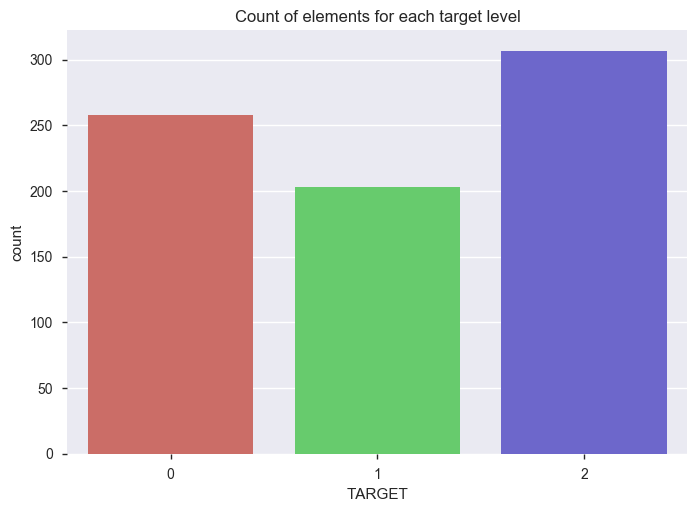

In [29]:
g = sns.countplot(x="TARGET", data=df, palette='hls')
g.set_title('Count of elements for each target level')

In [31]:
df = df.drop(['cod_ide'], axis=1)

In [32]:
y = df['TARGET']
X = df.drop('TARGET', axis=1)

In [33]:
X.shape, y.shape

((768, 58), (768,))

# Clustering

HDBSCAN(algorithm='best', allow_single_cluster=False, alpha=1.0,
    approx_min_span_tree=True, cluster_selection_method='eom',
    core_dist_n_jobs=4, gen_min_span_tree=True, leaf_size=40,
    match_reference_implementation=False, memory=Memory(cachedir=None),
    metric='euclidean', min_cluster_size=5, min_samples=None, p=None,
    prediction_data=False)

,nEntidades_competencia,nDesem_ult_semana,cero_cuotas,nPorcentaje_cero_cuotas_ope,nPorcentaje_sal_cero_cuo,Amonestacion,nAmonestacion_suspension,nvarsaldocapital,herencia,nporcentaje_Herencia,...,D__ASESOR COMERCIAL MASTER,D__ASESOR COMERCIAL SENIOR,D__Femenino,D__Masculino,D__Casado,D__Otros,D__Soltero,D__R,D__U,cluster
0,1,0.256354,1,0.000000,0.000000,0,0,0.013561,1,0.380552,...,0,0,0,1,0,0,1,0,1,-1
1,0,0.406922,1,0.001969,0.000141,0,0,0.042866,1,0.444054,...,1,0,1,0,0,1,0,0,1,-1
2,5,0.321911,1,0.000000,0.000000,0,0,-0.005801,1,0.020612,...,1,0,1,0,1,0,0,0,1,-1
3,3,0.294114,1,0.008791,0.015452,0,0,0.018111,1,0.300313,...,0,0,1,0,0,0,1,0,1,0
4,2,0.315331,0,0.000000,0.000000,0,0,0.004865,1,0.151475,...,0,0,1,0,0,0,1,0,1,1


DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=777, splitter='best')

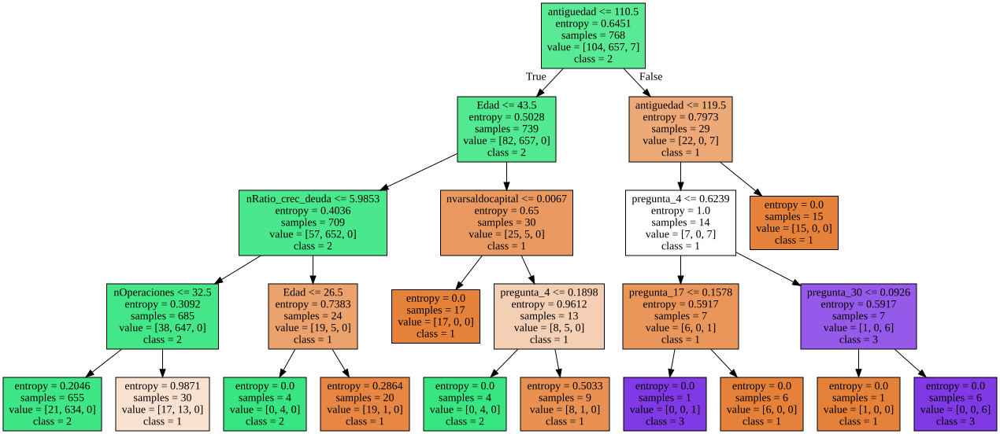

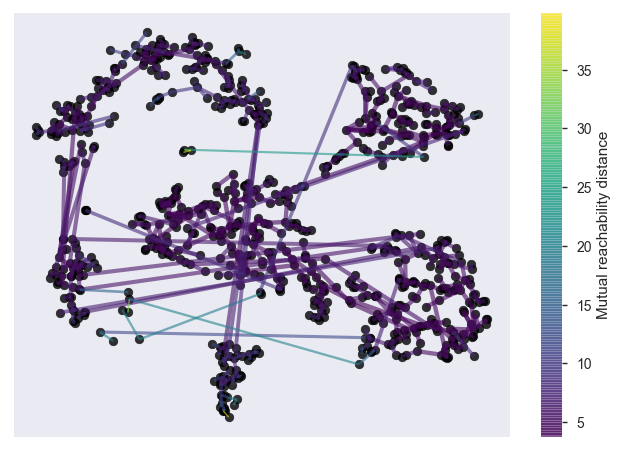

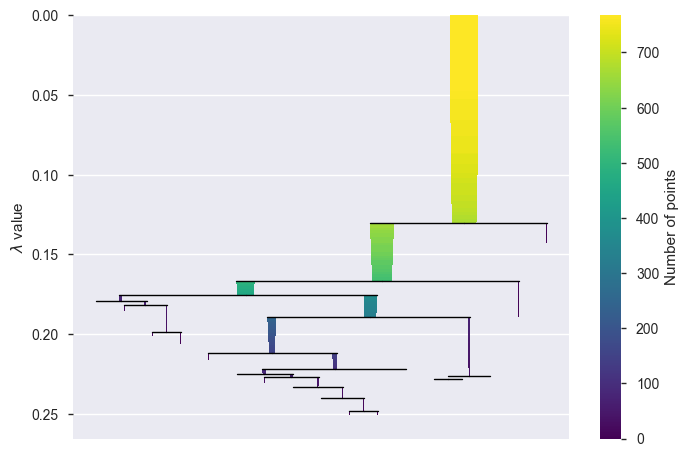

In [34]:
clusterer = hdbscan.HDBSCAN(gen_min_span_tree=True)
clusterer.fit(X)
plt.figure()
clusterer.minimum_spanning_tree_.plot(edge_cmap='viridis',
                                      edge_alpha=0.6,
                                      edge_linewidth=1)
plt.figure()
clusterer.condensed_tree_.plot(selection_palette=sns.color_palette())



palette = sns.color_palette()
cluster_colors = [sns.desaturate(palette[col], sat)
                  if col >= 0 else (0.5, 0.5, 0.5) for col, sat in
                  zip(clusterer.labels_, clusterer.probabilities_)]
X['cluster'] = pd.Series(clusterer.labels_)
X.head()
y_cluster = X['cluster']
X_cluster = X.drop('cluster', axis=1)

cluster_names = list(range(1, len(X['cluster'].value_counts()) + 1))

dtc = DecisionTreeClassifier(random_state=777, max_depth=4, criterion='entropy')
dtc.fit(X_cluster, y_cluster)

graph = Source(export_graphviz(dtc, out_file=None, feature_names=X_cluster.columns, filled=True, class_names=list(map(str, cluster_names))))

SVG(graph.pipe(format='svg'))

HDBSCAN(algorithm='best', allow_single_cluster=False, alpha=1.0,
    approx_min_span_tree=True, cluster_selection_method='eom',
    core_dist_n_jobs=4, gen_min_span_tree=True, leaf_size=40,
    match_reference_implementation=False, memory=Memory(cachedir=None),
    metric='euclidean', min_cluster_size=5, min_samples=None, p=None,
    prediction_data=False)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,nEntidades_competencia,nDesem_ult_semana,cero_cuotas,nPorcentaje_cero_cuotas_ope,nPorcentaje_sal_cero_cuo,Amonestacion,nAmonestacion_suspension,nvarsaldocapital,herencia,nporcentaje_Herencia,...,D__ASESOR COMERCIAL MASTER,D__ASESOR COMERCIAL SENIOR,D__Femenino,D__Masculino,D__Casado,D__Otros,D__Soltero,D__R,D__U,TARGET
1,0,0.406922,1,0.001969,0.000141,0,0,0.042866,1,0.444054,...,1,0,1,0,0,1,0,0,1,2
3,3,0.294114,1,0.008791,0.015452,0,0,0.018111,1,0.300313,...,0,0,1,0,0,0,1,0,1,2
6,0,0.075777,1,0.010038,0.001483,0,0,-0.000645,1,0.067877,...,0,0,1,0,1,0,0,0,1,2
12,6,0.494248,0,0.000000,0.000000,0,0,0.008872,1,0.283106,...,1,0,1,0,1,0,0,0,1,2
13,0,0.229230,1,0.000000,0.000000,0,0,-0.033884,1,0.368710,...,1,0,1,0,0,0,1,0,1,2


1     0.0
3    -1.0
6    -1.0
12    1.0
13    0.0
Name: cluster, dtype: float64

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=777, splitter='best')

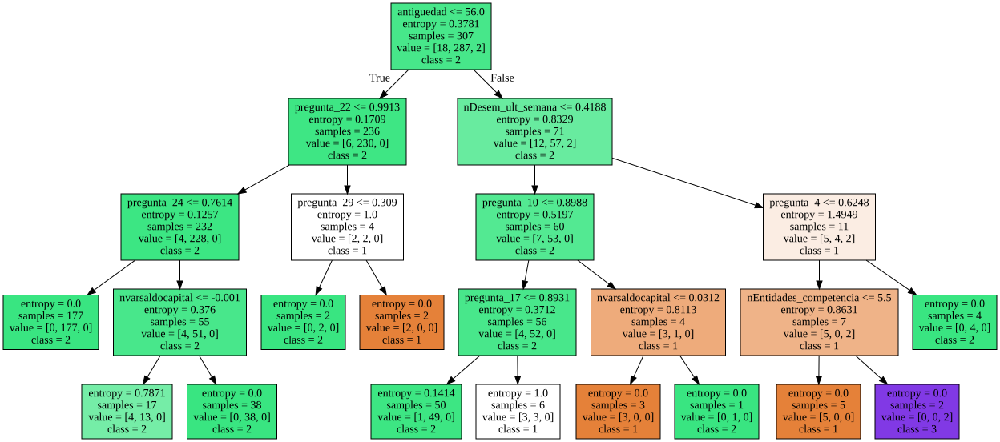

HDBSCAN(algorithm='best', allow_single_cluster=False, alpha=1.0,
    approx_min_span_tree=True, cluster_selection_method='eom',
    core_dist_n_jobs=4, gen_min_span_tree=True, leaf_size=40,
    match_reference_implementation=False, memory=Memory(cachedir=None),
    metric='euclidean', min_cluster_size=5, min_samples=None, p=None,
    prediction_data=False)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,nEntidades_competencia,nDesem_ult_semana,cero_cuotas,nPorcentaje_cero_cuotas_ope,nPorcentaje_sal_cero_cuo,Amonestacion,nAmonestacion_suspension,nvarsaldocapital,herencia,nporcentaje_Herencia,...,D__ASESOR COMERCIAL MASTER,D__ASESOR COMERCIAL SENIOR,D__Femenino,D__Masculino,D__Casado,D__Otros,D__Soltero,D__R,D__U,TARGET
0,1,0.256354,1,0.000000,0.000000,0,0,0.013561,1,0.380552,...,0,0,0,1,0,0,1,0,1,0
2,5,0.321911,1,0.000000,0.000000,0,0,-0.005801,1,0.020612,...,1,0,1,0,1,0,0,0,1,0
8,0,0.362352,1,0.016685,0.011728,1,1,0.031143,0,0.000000,...,0,0,0,1,0,1,0,0,1,0
9,2,0.221844,0,0.000000,0.000000,0,0,0.008442,1,0.049933,...,0,1,0,1,0,0,1,0,1,0
11,0,0.397763,1,0.003868,0.000118,0,0,0.008172,0,0.000000,...,1,0,1,0,1,0,0,0,1,0


0    -1.0
2    -1.0
8     1.0
9     1.0
11    1.0
Name: cluster, dtype: float64

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=777, splitter='best')

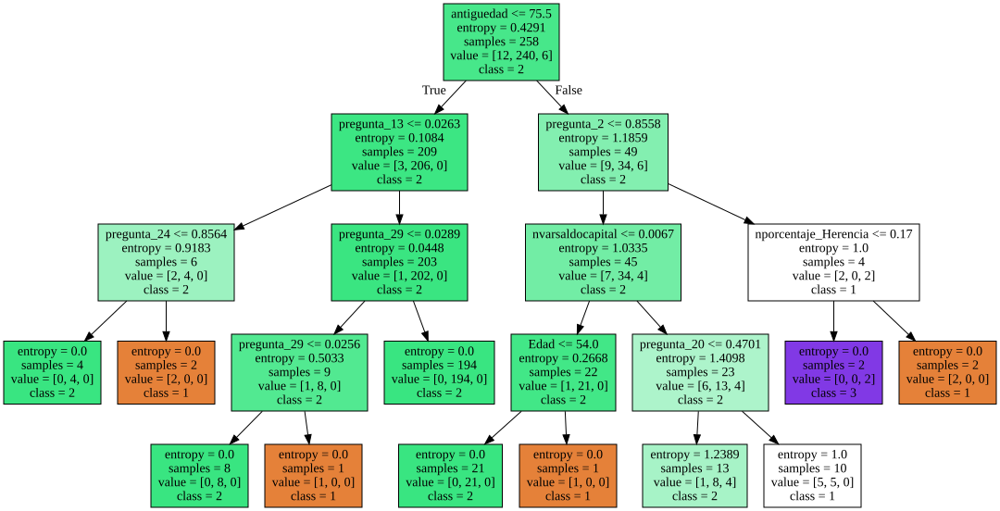

HDBSCAN(algorithm='best', allow_single_cluster=False, alpha=1.0,
    approx_min_span_tree=True, cluster_selection_method='eom',
    core_dist_n_jobs=4, gen_min_span_tree=True, leaf_size=40,
    match_reference_implementation=False, memory=Memory(cachedir=None),
    metric='euclidean', min_cluster_size=5, min_samples=None, p=None,
    prediction_data=False)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,nEntidades_competencia,nDesem_ult_semana,cero_cuotas,nPorcentaje_cero_cuotas_ope,nPorcentaje_sal_cero_cuo,Amonestacion,nAmonestacion_suspension,nvarsaldocapital,herencia,nporcentaje_Herencia,...,D__ASESOR COMERCIAL MASTER,D__ASESOR COMERCIAL SENIOR,D__Femenino,D__Masculino,D__Casado,D__Otros,D__Soltero,D__R,D__U,TARGET
4,2,0.315331,0,0.000000,0.00000,0,0,0.004865,1,0.151475,...,0,0,1,0,0,0,1,0,1,1
5,5,0.351645,1,0.004474,0.00126,0,0,0.019909,1,0.402010,...,1,0,1,0,0,0,1,0,1,1
7,0,0.461129,0,0.000000,0.00000,0,0,-0.009965,1,0.065337,...,0,0,0,1,0,0,1,0,1,1
10,1,0.284317,0,0.000000,0.00000,0,0,-0.009481,1,0.103537,...,0,0,1,0,0,0,1,0,1,1
15,4,0.263154,1,0.000000,0.00000,0,0,0.022777,1,0.253971,...,0,1,0,1,0,0,1,0,1,1


4     1.0
5    -1.0
7    -1.0
10   -1.0
15   -1.0
Name: cluster, dtype: float64

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=777, splitter='best')

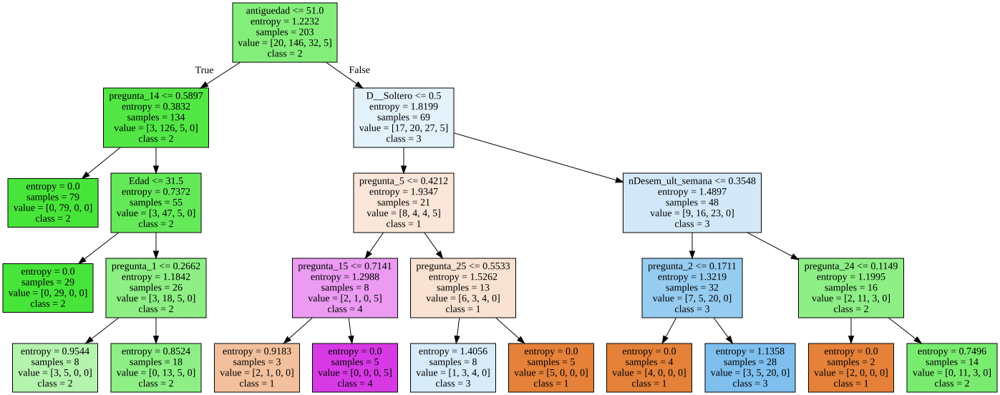

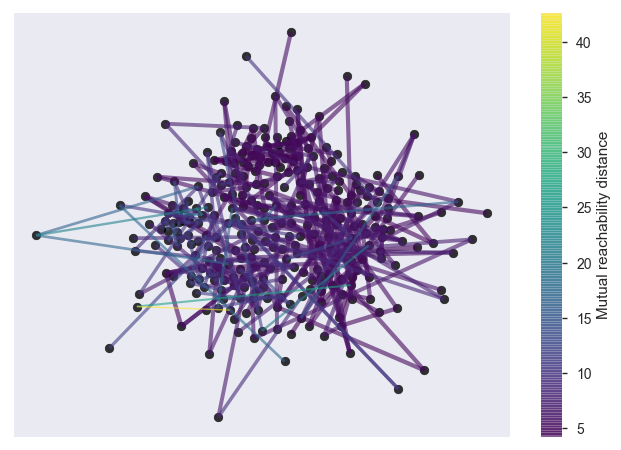

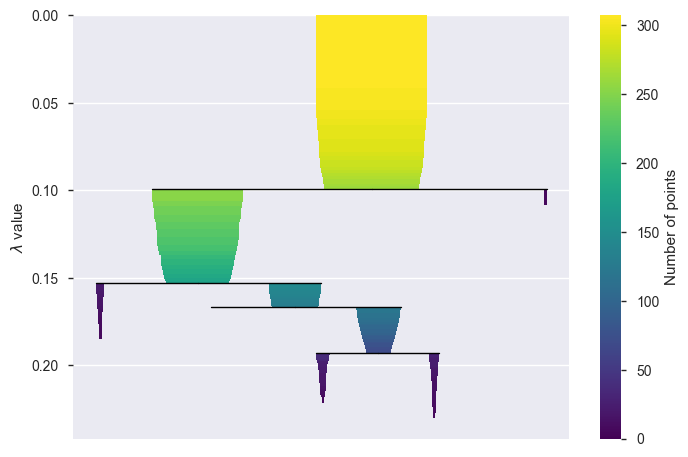

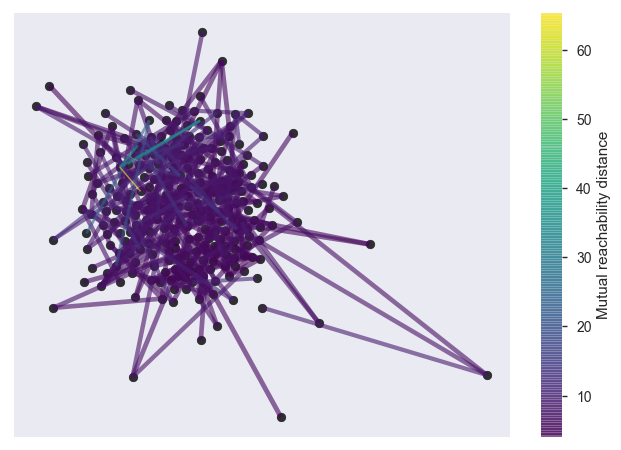

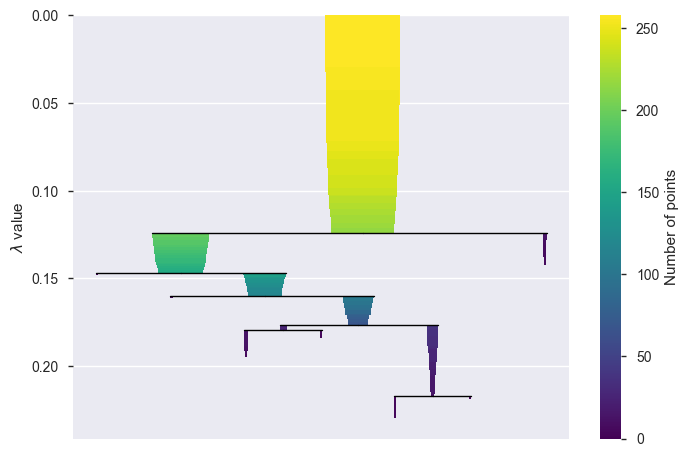

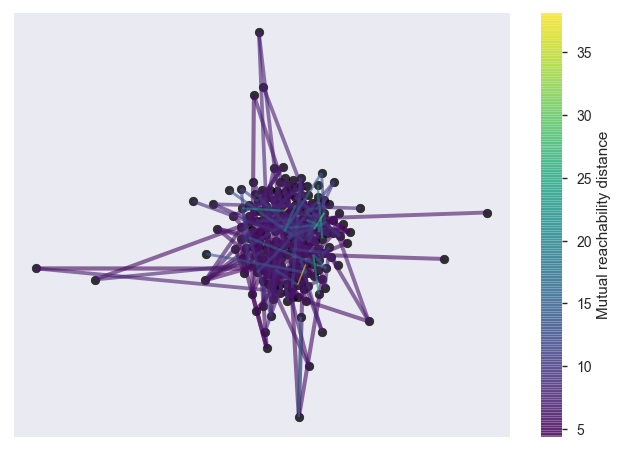

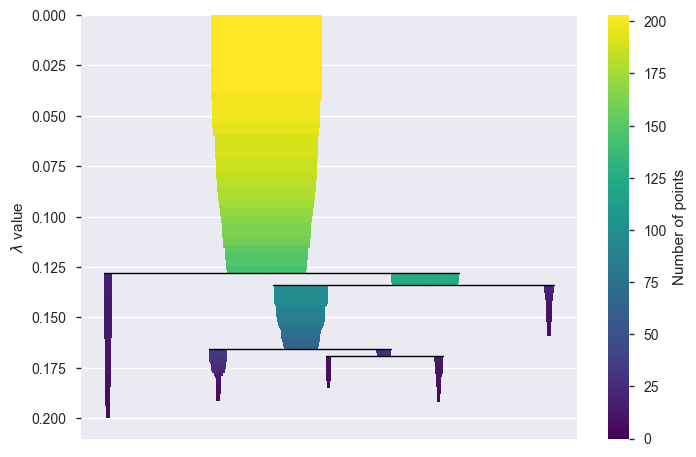

In [35]:
for target_class in list(y.value_counts().index):
    X_target = df.loc[df['TARGET'] == target_class]
    clusterer = hdbscan.HDBSCAN(gen_min_span_tree=True)
    clusterer.fit(X_target)
    plt.figure()
    clusterer.minimum_spanning_tree_.plot(edge_cmap='viridis',
                                          edge_alpha=0.6,
                                          edge_linewidth=1)
    plt.figure()
    clusterer.condensed_tree_.plot(selection_palette=sns.color_palette())
    palette = sns.color_palette()
    cluster_colors = [sns.desaturate(palette[col], sat)
                      if col >= 0 else (0.5, 0.5, 0.5) for col, sat in
                      zip(clusterer.labels_, clusterer.probabilities_)]
    X_target['cluster'] = pd.Series(clusterer.labels_)
    y_cluster = X_target['cluster']
    X_cluster = X_target.drop('cluster', axis=1)
    
    X_cluster.head()
    y_cluster.head()
    
    cluster_names = list(range(1, len(X_target['cluster'].value_counts()) + 1))

    dtc = DecisionTreeClassifier(random_state=777, max_depth=4, criterion='entropy')
    dtc.fit(X_cluster.fillna(0), y_cluster.fillna(0))

    graph = Source(export_graphviz(dtc, out_file=None, feature_names=X_cluster.columns, filled=True, class_names=list(map(str, cluster_names))))

    SVG(graph.pipe(format='svg'))

In [36]:
X.shape, y.shape

((768, 59), (768,))

In [37]:
X.to_csv('hk2_X.csv', index=False)
y.to_csv('hk2_y.csv', index=False)

# Cross-validation

In [38]:
eval_size = 0.1
kf = StratifiedKFold(df['TARGET'], round(1./eval_size))
train_ix, valid_ix = next(iter(kf))

In [39]:
X_train, y_train = X.iloc[train_ix], y.iloc[train_ix]
X_valid, y_valid = X.iloc[valid_ix], y.iloc[valid_ix]
X_train.shape, y_train.shape
X_valid.shape, y_valid.shape

((690, 59), (690,))

((78, 59), (78,))

In [40]:
def increase_value(feature, temp, value):

    before_value = temp.loc[feature]
    after_value = temp.loc[feature] + value

    before = model.predict(temp)[0]
    temp.loc[feature] += value
    after = model.predict(temp)[0]
    
    if sum(before == after) == 0:  
        print('\nIncreasing {}'.format(feature))
        print('From {} to {}'.format(before_value, after_value))
        print('Before: {} (class {})'.format(before, list(before).index(max(before))))
        print(' After: {} (class {})'.format(after, list(after).index(max(after))))

In [41]:
def decrease_value(feature, temp, value):

    before_value = temp.loc[feature]
    after_value = temp.loc[feature] - value

    before = model.predict(temp)[0]
    temp.loc[feature] -= value
    after = model.predict(temp)[0]
    
    if sum(before == after) == 0:  
        print('\nDecreasing {}'.format(feature))
        print('From {} to {}'.format(before_value, after_value))
        print('Before: {} (class {})'.format(before, list(before).index(max(before))))
        print(' After: {} (class {})'.format(after, list(after).index(max(after))))

# Models

In [42]:
model_results = {
    'lightgbm': {
        'recall': None,
        'precision': None,
        'accuracy': None,
        'fe_entropy': [],
        'fe_rfe': []
    },
    'random_forest': {
        'recall': None,
        'precision': None,
        'accuracy': None,
        'fe_entropy': [],
        'fe_rfe': []
    },
    'extra_trees': {
        'recall': None,
        'precision': None,
        'accuracy': None,
        'fe_entropy': [],
        'fe_rfe': []
    }
}

## LightGBM

In [43]:
d_train = lgb.Dataset(X_train, y_train)
d_valid = lgb.Dataset(X_valid, y_valid, reference=d_train)

RandomizedSearchCV(cv=10, error_score='raise',
          estimator=LGBMClassifier(boosting_type='gbdt', colsample_bytree=1, learning_rate=0.1,
        max_bin=255, max_depth=-1, min_child_samples=10,
        min_child_weight=5, min_split_gain=0, n_estimators=10, nthread=-1,
        num_leaves=31, objective='binary', reg_alpha=0, reg_lambda=0,
        seed=0, silent=True, subsample=1, subsample_for_bin=50000,
        subsample_freq=1),
          fit_params={}, iid=True, n_iter=10, n_jobs=1,
          param_distributions={'learning_rate': [0.01, 0.02, 0.03, 0.04, 0.05], 'num_leaves': [8, 10, 20, 30, 40, 50], 'boosting_type': ['gbdt'], 'objective': ['multiclass'], 'metric': ['multi_logloss'], 'num_class': [3], 'seed': [777], 'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1], 'subsample': [0.6, 0.7, 0.8, 0.9, 1], 'reg_alpha': [0, 0.1, 0.5, 1], 'reg_lambda': [0, 0.01, 0.05, 0.1, 1, 2, 5, 6, 7, 9, 10], 'is_unbalance': [True, False]},
          pre_dispatch='2*n_jobs', random_state=None, refit=True

{'boosting_type': 'gbdt',
 'colsample_bytree': 0.9,
 'is_unbalance': False,
 'learning_rate': 0.01,
 'metric': 'multi_logloss',
 'num_class': 3,
 'num_leaves': 8,
 'objective': 'multiclass',
 'reg_alpha': 0,
 'reg_lambda': 0,
 'seed': 777,
 'subsample': 0.7}

Recall: 0.7741935483870968
Precision: 0.5714285714285714
Accuracy: 0.6153846153846154


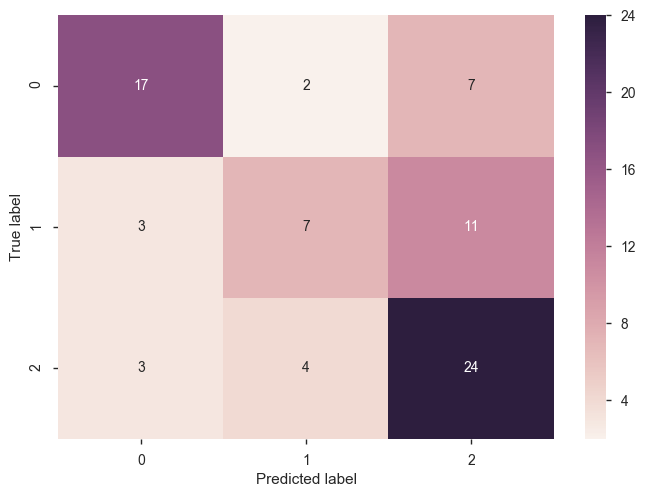

In [44]:
estimator = lgb.LGBMClassifier()
param_grid = {
    'learning_rate': [0.01, 0.02, 0.03,0.04, 0.05],
    'num_leaves': [8, 10, 20, 30, 40, 50],
    'boosting_type' : ['gbdt'],
    'objective' : ['multiclass'],
    'metric': ['multi_logloss'],
    'num_class': [3],
    'seed' : [777],
    'colsample_bytree' : [0.6, 0.7,0.8,0.9,1],
    'subsample' : [0.6, 0.7,0.8,0.9,1],
    'reg_alpha' : [0,0.1,0.5,1],
    'reg_lambda' : [0,0.01, 0.05, 0.1, 1,2,5,6,7,9,10],
    'is_unbalance' : [True,False],
}
clf = RandomizedSearchCV(estimator, param_grid, cv=10)
clf.fit(X_train, y_train)
clf.best_params_

y_pred = clf.predict(X_valid)

cm = confusion_matrix(y_valid, y_pred)
g = sns.heatmap(cm, annot=True)
g.yaxis.set_ticklabels(g.yaxis.get_ticklabels())
g.xaxis.set_ticklabels(g.xaxis.get_ticklabels())
plt.ylabel('True label')
plt.xlabel('Predicted label')

print('Recall: {}'.format(cm[2][2]/sum(cm[2])))
print('Precision: {}'.format(cm[2][2]/(cm[0][2] + cm[1][2] + cm[2][2])))
print('Accuracy: {}'.format(accuracy_score(y_pred, y_valid)))

[1]	valid_0's multi_logloss: 1.09613
[2]	valid_0's multi_logloss: 1.09394
[3]	valid_0's multi_logloss: 1.09183
[4]	valid_0's multi_logloss: 1.08969
[5]	valid_0's multi_logloss: 1.08771
[6]	valid_0's multi_logloss: 1.08556
[7]	valid_0's multi_logloss: 1.08346
[8]	valid_0's multi_logloss: 1.08146
[9]	valid_0's multi_logloss: 1.07909
[10]	valid_0's multi_logloss: 1.07721
[11]	valid_0's multi_logloss: 1.07547
[12]	valid_0's multi_logloss: 1.07385
[13]	valid_0's multi_logloss: 1.07208
[14]	valid_0's multi_logloss: 1.07045
[15]	valid_0's multi_logloss: 1.06855
[16]	valid_0's multi_logloss: 1.06693
[17]	valid_0's multi_logloss: 1.06529
[18]	valid_0's multi_logloss: 1.06332
[19]	valid_0's multi_logloss: 1.06124
[20]	valid_0's multi_logloss: 1.06
[21]	valid_0's multi_logloss: 1.05916
[22]	valid_0's multi_logloss: 1.05766
[23]	valid_0's multi_logloss: 1.05579
[24]	valid_0's multi_logloss: 1.05441
[25]	valid_0's multi_logloss: 1.05347
[26]	valid_0's multi_logloss: 1.05177
[27]	valid_0's multi_log

Recall: 0.7096774193548387
Precision: 0.55
Accuracy: 0.5384615384615384


Feature importance based on entropy:
Feature ranking with recursive feature elimination:


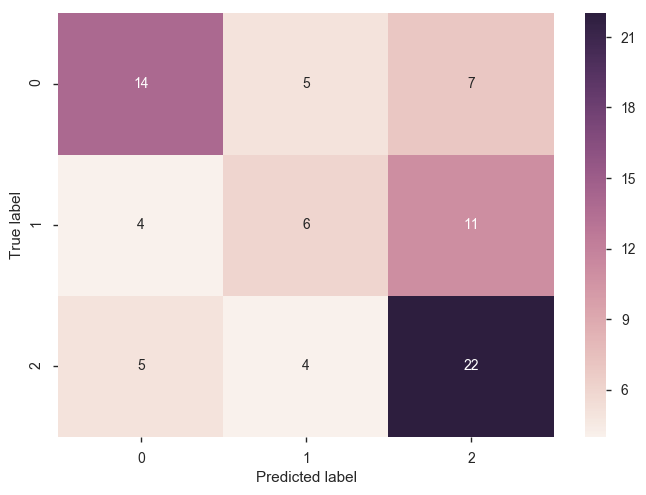

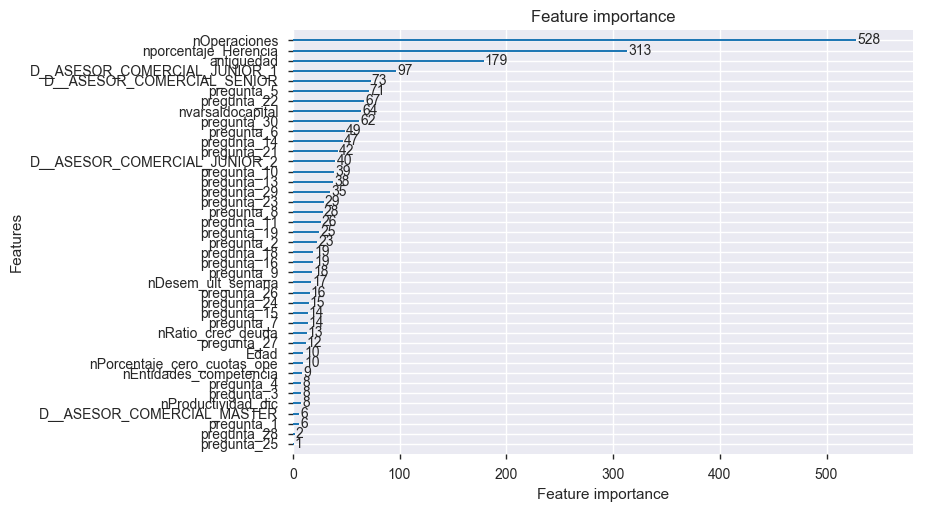

In [45]:
model = lgb.train(clf.best_params_, d_train, 100, valid_sets=d_valid)

y_pred = model.predict(X_valid)

y_pred_trunc = list()
for row in y_pred:
    y_pred_trunc.append(list(row).index(max(row)))
y_pred_trunc = pd.Series(y_pred_trunc)

cm = confusion_matrix(y_valid, y_pred_trunc)
g = sns.heatmap(cm, annot=True)
g.yaxis.set_ticklabels(g.yaxis.get_ticklabels())
g.xaxis.set_ticklabels(g.xaxis.get_ticklabels())
plt.ylabel('True label')
plt.xlabel('Predicted label')

recall = cm[2][2]/sum(cm[2])
print('Recall: {}'.format(recall))
model_results['lightgbm']['recall'] = recall

precision = cm[2][2]/(cm[0][2] + cm[1][2] + cm[2][2])
print('Precision: {}'.format(precision))
model_results['lightgbm']['precision'] = precision

accuracy = accuracy_score(y_pred_trunc, y_valid)
print('Accuracy: {}'.format(accuracy))
model_results['lightgbm']['accuracy'] = accuracy

lgb.plot_importance(model)

print('Feature importance based on entropy:')
d = dict(zip(model.feature_name(), model.feature_importance()))
fe_entropy = sorted(d.items(), key=lambda x: x[1], reverse=True)
model_results['lightgbm']['fe_entropy'] = fe_entropy

print('Feature ranking with recursive feature elimination:')
selector = RFE(estimator, 5, step=1)
selector = selector.fit(X, y)
d = dict(zip(X.columns, selector.ranking_))
fe_rfe = sorted(d.items(), key=lambda x: x[1])
model_results['lightgbm']['fe_rfe'] = fe_rfe

### LIME using LightGBM

In [46]:
explainer = lime_tabular.LimeTabularExplainer(
    X_train, 
    feature_names=list(X_train),
    discretize_continuous=False
    )
i = np.random.randint(0, X_valid.shape[0])
exp = explainer.explain_instance(X_valid.iloc[i], model.predict)
exp.show_in_notebook(show_table=True, show_all=False)
temp = X_valid.iloc[i].copy()
for feature in X_valid.columns:
    increase_value(feature, temp, 10)
    decrease_value(feature, temp, 20)

C:\ProgramData\Anaconda3\lib\site-packages\lightgbm\basic.py:423: UserWarning: Converting data to scipy sparse matrix.
  warnings.warn('Converting data to scipy sparse matrix.')



Increasing nEntidades_competencia
From 0.0 to 10.0
Before: [ 0.20356591  0.36547932  0.43095477] (class 2)
 After: [ 0.2040323   0.36402555  0.43194215] (class 2)

Decreasing nEntidades_competencia
From 10.0 to -10.0
Before: [ 0.2040323   0.36402555  0.43194215] (class 2)
 After: [ 0.20356591  0.36547932  0.43095477] (class 2)

Decreasing nDesem_ult_semana
From 10.494715447154473 to -9.505284552845527
Before: [ 0.20356591  0.36547932  0.43095477] (class 2)
 After: [ 0.1942083   0.34867881  0.45711289] (class 2)

Increasing nvarsaldocapital
From 0.00694922361085393 to 10.006949223610855
Before: [ 0.1942083   0.34867881  0.45711289] (class 2)
 After: [ 0.207416    0.34211475  0.45046925] (class 2)

Decreasing nvarsaldocapital
From 10.006949223610855 to -9.993050776389145
Before: [ 0.207416    0.34211475  0.45046925] (class 2)
 After: [ 0.1942083   0.34867881  0.45711289] (class 2)

Increasing nporcentaje_Herencia
From 0.0121554965226507 to 10.01215549652265
Before: [ 0.1942083   0.34867

## Random Forest

RandomizedSearchCV(cv=10, error_score='raise',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=1, oob_score=False, random_state=777,
            verbose=0, warm_start=False),
          fit_params={}, iid=True, n_iter=10, n_jobs=1,
          param_distributions={'n_estimators': [120, 300, 500, 800, 1200], 'max_depth': [5, 8, 15, 25, 30, None], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [2, 5, 10]},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score=True, scoring=None, verbose=0)

{'max_depth': 15,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 500}

Recall: 0.6774193548387096
Precision: 0.5675675675675675
Accuracy: 0.5128205128205128


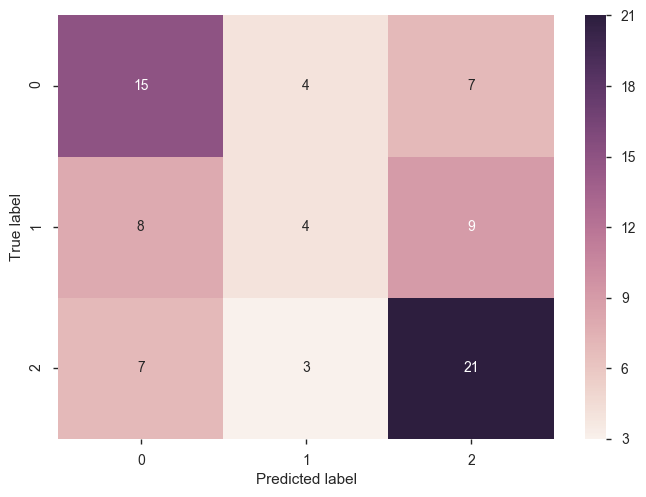

In [47]:
estimator = RandomForestClassifier(random_state=777)
param_grid = {
    'n_estimators': [120, 300, 500, 800, 1200],
    'max_depth': [5, 8, 15, 25, 30, None],
    'min_samples_split': [2, 5, 10, 15, 100],
    'min_samples_leaf': [2, 5, 10]
}
clf = RandomizedSearchCV(estimator, param_grid, cv=10)
clf.fit(X_train, y_train)
clf.best_params_

y_pred = clf.predict(X_valid)

cm = confusion_matrix(y_valid, y_pred)
g = sns.heatmap(cm, annot=True)
g.yaxis.set_ticklabels(g.yaxis.get_ticklabels())
g.xaxis.set_ticklabels(g.xaxis.get_ticklabels())
plt.ylabel('True label')
plt.xlabel('Predicted label')

print('Recall: {}'.format(cm[2][2]/sum(cm[2])))
print('Precision: {}'.format(cm[2][2]/(cm[0][2] + cm[1][2] + cm[2][2])))
print('Accuracy: {}'.format(accuracy_score(y_pred, y_valid)))

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=15, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=2,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=500, n_jobs=1, oob_score=False, random_state=777,
            verbose=0, warm_start=False)

Recall: 0.6774193548387096
Precision: 0.5675675675675675
Accuracy: 0.5128205128205128
Feature importance based on entropy:
Feature ranking with recursive feature elimination:


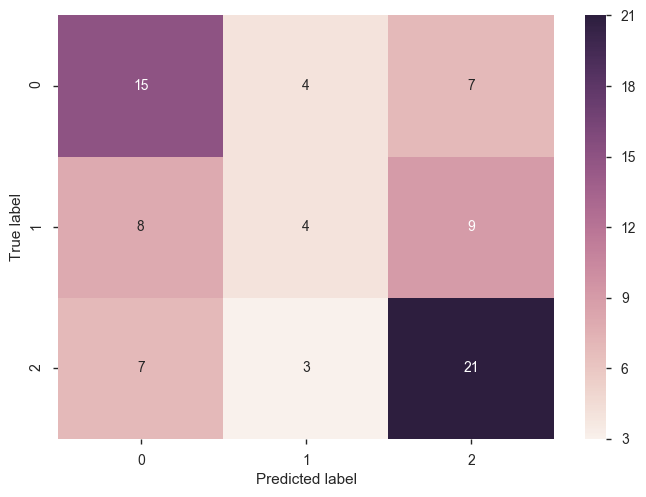

In [48]:
model = RandomForestClassifier(
    max_depth=clf.best_params_['max_depth'],
    min_samples_leaf=clf.best_params_['min_samples_leaf'],
    min_samples_split=clf.best_params_['min_samples_split'],
    n_estimators=clf.best_params_['n_estimators'],
    random_state=777)

model.fit(X_train, y_train)

y_pred = model.predict(X_valid)

cm = confusion_matrix(y_valid, y_pred)
g = sns.heatmap(cm, annot=True)
g.yaxis.set_ticklabels(g.yaxis.get_ticklabels())
g.xaxis.set_ticklabels(g.xaxis.get_ticklabels())
plt.ylabel('True label')
plt.xlabel('Predicted label')

recall = cm[2][2]/sum(cm[2])
print('Recall: {}'.format(recall))
model_results['random_forest']['recall'] = recall

precision = cm[2][2]/(cm[0][2] + cm[1][2] + cm[2][2])
print('Precision: {}'.format(precision))
model_results['random_forest']['precision'] = precision

accuracy = accuracy_score(y_pred, y_valid)
print('Accuracy: {}'.format(accuracy))
model_results['random_forest']['accuracy'] = accuracy

print('Feature importance based on entropy:')
d = dict(zip(list(X_train), model.feature_importances_))
fe_entropy = sorted(d.items(), key=lambda x: x[1], reverse=True)
model_results['random_forest']['fe_entropy'] = fe_entropy

print('Feature ranking with recursive feature elimination:')
selector = RFE(estimator, 5, step=1)
selector = selector.fit(X, y)
d = dict(zip(X.columns, selector.ranking_))
fe_rfe = sorted(d.items(), key=lambda x: x[1])
model_results['random_forest']['fe_rfe'] = fe_rfe

### LIME using Random Forests

In [49]:
explainer = lime_tabular.LimeTabularExplainer(
    X_train, 
    feature_names=list(X_train),
    discretize_continuous=False
    )
i = np.random.randint(0, X_valid.shape[0])
exp = explainer.explain_instance(X_valid.iloc[i], model.predict_proba)
exp.show_in_notebook(show_table=True, show_all=False)

# Extra Trees

RandomizedSearchCV(cv=10, error_score='raise',
          estimator=ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
           max_depth=None, max_features='auto', max_leaf_nodes=None,
           min_impurity_split=1e-07, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=10, n_jobs=1, oob_score=False, random_state=777,
           verbose=0, warm_start=False),
          fit_params={}, iid=True, n_iter=10, n_jobs=1,
          param_distributions={'n_estimators': [120, 300, 500, 800, 1200], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [2, 5, 10]},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score=True, scoring=None, verbose=0)

{'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 500}

Recall: 0.8064516129032258
Precision: 0.5434782608695652
Accuracy: 0.5128205128205128


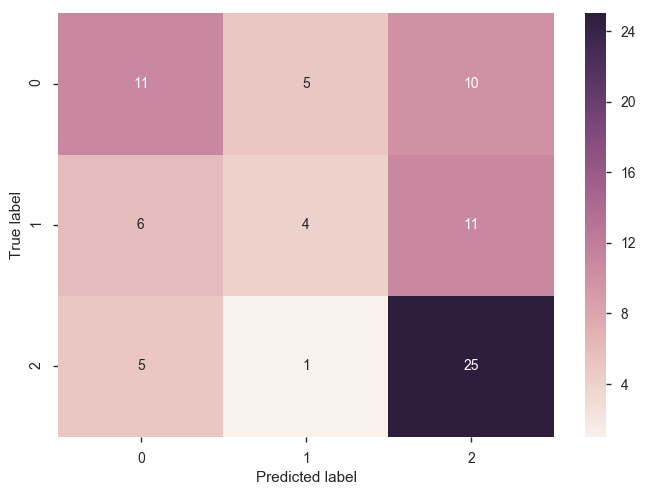

In [50]:
estimator = ExtraTreesClassifier(random_state=777)
param_grid = {
    'n_estimators': [120, 300, 500, 800, 1200],
    'min_samples_split': [2, 5, 10, 15, 100],
    'min_samples_leaf': [2, 5, 10]
}
clf = RandomizedSearchCV(estimator, param_grid, cv=10)
clf.fit(X_train, y_train)
clf.best_params_

y_pred = clf.predict(X_valid)

cm = confusion_matrix(y_valid, y_pred)
g = sns.heatmap(cm, annot=True)
g.yaxis.set_ticklabels(g.yaxis.get_ticklabels())
g.xaxis.set_ticklabels(g.xaxis.get_ticklabels())
plt.ylabel('True label')
plt.xlabel('Predicted label')

print('Recall: {}'.format(cm[2][2]/sum(cm[2])))
print('Precision: {}'.format(cm[2][2]/(cm[0][2] + cm[1][2] + cm[2][2])))
print('Accuracy: {}'.format(accuracy_score(y_pred, y_valid)))

ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
           max_depth=None, max_features='auto', max_leaf_nodes=None,
           min_impurity_split=1e-07, min_samples_leaf=2,
           min_samples_split=5, min_weight_fraction_leaf=0.0,
           n_estimators=500, n_jobs=1, oob_score=False, random_state=777,
           verbose=0, warm_start=False)

Recall: 0.8064516129032258
Precision: 0.5434782608695652
Accuracy: 0.5128205128205128
Feature importance based on entropy:
Feature ranking with recursive feature elimination:


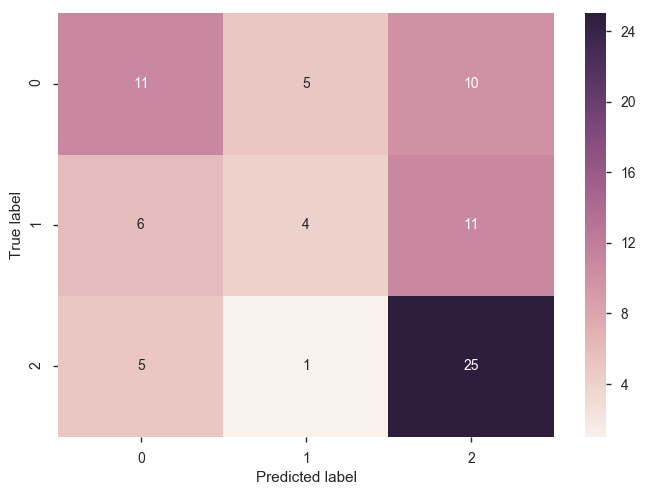

In [51]:
model = ExtraTreesClassifier(
    min_samples_leaf=clf.best_params_['min_samples_leaf'],
    min_samples_split=clf.best_params_['min_samples_split'],
    n_estimators=clf.best_params_['n_estimators'],
    random_state=777)
model.fit(X_train, y_train)
y_pred = model.predict(X_valid)
cm = confusion_matrix(y_valid, y_pred)
g = sns.heatmap(cm, annot=True)
g.yaxis.set_ticklabels(g.yaxis.get_ticklabels())
g.xaxis.set_ticklabels(g.xaxis.get_ticklabels())
plt.ylabel('True label')
plt.xlabel('Predicted label')

recall = cm[2][2]/sum(cm[2])
print('Recall: {}'.format(recall))
model_results['extra_trees']['recall'] = recall

precision = cm[2][2]/(cm[0][2] + cm[1][2] + cm[2][2])
print('Precision: {}'.format(precision))
model_results['extra_trees']['precision'] = precision

accuracy = accuracy_score(y_pred, y_valid)
print('Accuracy: {}'.format(accuracy))
model_results['extra_trees']['accuracy'] = accuracy

print('Feature importance based on entropy:')
d = dict(zip(list(X_train), model.feature_importances_))
fe_entropy = sorted(d.items(), key=lambda x: x[1], reverse=True)
model_results['extra_trees']['fe_entropy'] = fe_entropy

print('Feature ranking with recursive feature elimination:')
selector = RFE(estimator, 5, step=1)
selector = selector.fit(X, y)
d = dict(zip(X.columns, selector.ranking_))
fe_rfe = sorted(d.items(), key=lambda x: x[1])
model_results['extra_trees']['fe_rfe'] = fe_rfe

### LIME using Extra Trees

In [52]:
explainer = lime_tabular.LimeTabularExplainer(
    X_train, 
    feature_names=list(X_train),
    discretize_continuous=False
    )
i = np.random.randint(0, X_valid.shape[0])
exp = explainer.explain_instance(X_valid.iloc[i], model.predict_proba)
exp.show_in_notebook(show_table=True, show_all=False)

### Garbage collection

In [53]:
del DecisionTreeClassifier, ExtraTreesClassifier, RandomForestClassifier, RandomizedSearchCV, RFE, SVG, Source, StratifiedKFold
del X, y, X_cluster, X_target, X_train, X_valid, accuracy, accuracy_score, categories, clf, cluster_colors, clusterer, cm
del confusion_matrix, convert_score, cuts, d, d_train, d_valid, df_categorical, df_continuous, df_discrete, df_numeric, dtc
del dtypes, estimator, eval_size, export_graphviz, f1_score, fe_entropy, fe_rfe, feature, g, graph, hdbscan
del i, kf, lgb, make_correlation_graphic, margin1, margin2, model, pair_vars, pandas_profiling, param_grid
del precision, precision_score, recall, recall_score, row, selector, target_class, train_ix, valid_ix, y_cluster, y_pred
del y_pred_trunc, y_train, y_valid
collect()

623

# Results

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:429: DataConversionWarning: Data with input dtype int64 was converted to float64 by the normalize function.
  warnings.warn(msg, _DataConversionWarning)


,entropy,rfe,N_entropy,N_rfe,score
nOperaciones,0.060053,1,0.424284,0.004189,0.428473
cero_cuotas,0.024389,35,0.172309,0.146619,0.318928
D__ASESOR COMERCIAL JUNIOR 1,0.013027,53,0.092040,0.222024,0.314064
herencia,0.013371,49,0.094470,0.205267,0.299737
D__Masculino,0.013176,47,0.093093,0.196889,0.289982
nAmonestacion_suspension,0.014842,44,0.104863,0.184322,0.289185
nProductividad_dic,0.017679,39,0.124901,0.163376,0.288277
D__R,0.011025,50,0.077891,0.209456,0.287347
ingresoef,0.013364,46,0.094420,0.192700,0.287119
D__ASESOR COMERCIAL MASTER,0.009558,52,0.067528,0.217835,0.285363


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58]),
 <a list of 59 Text xticklabel objects>)

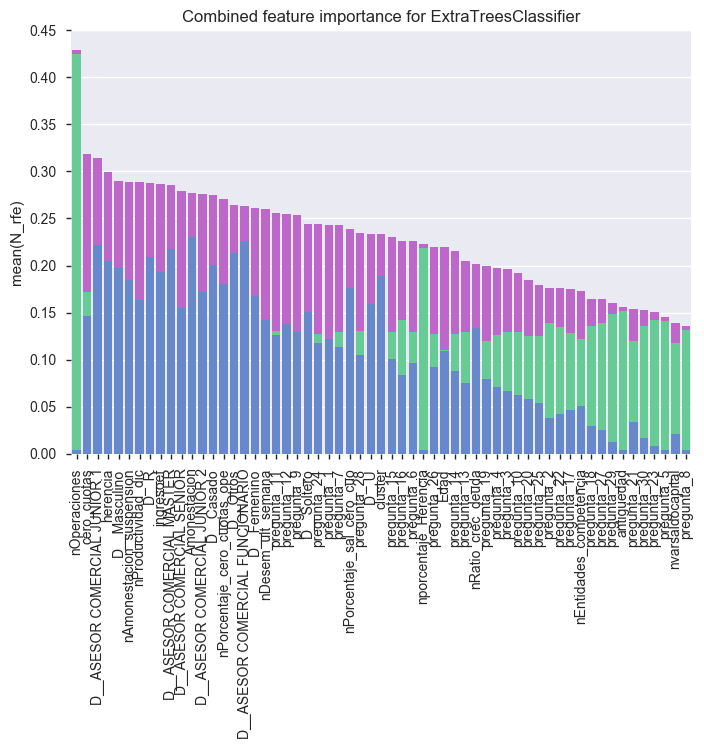

In [54]:
df1 = pd.DataFrame(model_results['extra_trees']['fe_entropy']).set_index(0)
df2 = pd.DataFrame(model_results['extra_trees']['fe_rfe']).set_index(0)
results_extra_trees = pd.concat([df1, df2], axis=1)

results_extra_trees.columns = ['entropy', 'rfe']
results_extra_trees['N_entropy'] = normalize(results_extra_trees['entropy'])[0]
results_extra_trees['N_rfe'] = normalize(results_extra_trees['rfe'])[0]

results_extra_trees['score'] = results_extra_trees['N_entropy'] + results_extra_trees['N_rfe']

results_extra_trees = results_extra_trees.sort_values('score', ascending=False)

results_extra_trees

plt.title('Combined feature importance for ExtraTreesClassifier')
sns.barplot(x=results_extra_trees.index, y=results_extra_trees['score'], color=sns.color_palette("hls", 5)[4])
sns.barplot(x=results_extra_trees.index, y=results_extra_trees['N_entropy'], color=sns.color_palette("hls", 5)[2])
sns.barplot(x=results_extra_trees.index, y=results_extra_trees['N_rfe'], color=sns.color_palette("hls", 5)[3])
plt.xticks(rotation=90)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:429: DataConversionWarning: Data with input dtype int64 was converted to float64 by the normalize function.
  warnings.warn(msg, _DataConversionWarning)


,entropy,rfe,N_entropy,N_rfe,score
nOperaciones,0.068980,1,0.422587,0.004189,0.426776
nporcentaje_Herencia,0.048938,1,0.299802,0.004189,0.303991
antiguedad,0.044485,3,0.272523,0.012567,0.285091
pregunta_7,0.021102,34,0.129277,0.142430,0.271707
pregunta_13,0.022532,30,0.138033,0.125674,0.263707
pregunta_4,0.019909,32,0.121969,0.134052,0.256021
pregunta_15,0.021533,29,0.131918,0.121485,0.253403
pregunta_14,0.026059,22,0.159642,0.092161,0.251803
pregunta_10,0.023175,26,0.141972,0.108917,0.250889
nDesem_ult_semana,0.022361,27,0.136988,0.113106,0.250094


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58]),
 <a list of 59 Text xticklabel objects>)

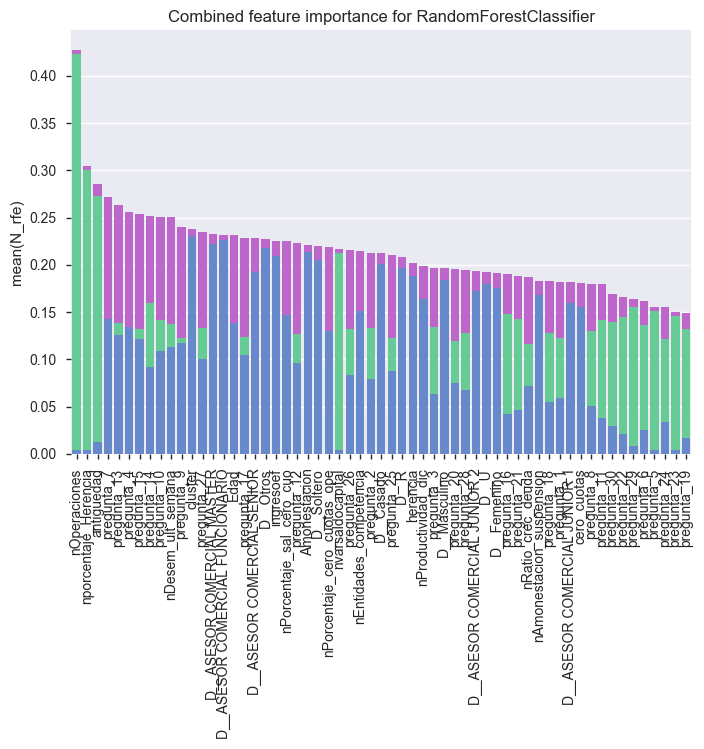

In [55]:
df1 = pd.DataFrame(model_results['random_forest']['fe_entropy']).set_index(0)
df2 = pd.DataFrame(model_results['random_forest']['fe_rfe']).set_index(0)
results_random_forest = pd.concat([df1, df2], axis=1)

results_random_forest.columns = ['entropy', 'rfe']
results_random_forest['N_entropy'] = normalize(results_random_forest['entropy'])[0]
results_random_forest['N_rfe'] = normalize(results_random_forest['rfe'])[0]

results_random_forest['score'] = results_random_forest['N_entropy'] + results_random_forest['N_rfe']

results_random_forest = results_random_forest.sort_values('score', ascending=False)

results_random_forest

plt.title('Combined feature importance for RandomForestClassifier')
sns.barplot(x=results_random_forest.index, y=results_random_forest['score'], color=sns.color_palette("hls", 5)[4])
sns.barplot(x=results_random_forest.index, y=results_random_forest['N_entropy'], color=sns.color_palette("hls", 5)[2])
sns.barplot(x=results_random_forest.index, y=results_random_forest['N_rfe'], color=sns.color_palette("hls", 5)[3])
plt.xticks(rotation=90)

,nOperaciones,nporcentaje_Herencia,antiguedad,D__ASESOR_COMERCIAL_JUNIOR_1,D__ASESOR_COMERCIAL_SENIOR,pregunta_5,pregunta_22,nvarsaldocapital,pregunta_30,pregunta_6,...,pregunta_20,D__ASESOR_COMERCIAL_FUNCIONARIO,D__Femenino,D__Masculino,D__Casado,D__Otros,D__Soltero,D__R,D__U,cluster
1,528,313,179,97,73,71,67,64,62,49,...,0,0,0,0,0,0,0,0,0,0


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:429: DataConversionWarning: Data with input dtype int64 was converted to float64 by the normalize function.
  warnings.warn(msg, _DataConversionWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


,entropy,rfe,N_entropy,N_rfe,score
nOperaciones,528,1,0.778754,0.004189,0.782943
nporcentaje_Herencia,313,2,0.461648,0.008378,0.470026
antiguedad,179,1,0.264010,0.004189,0.268199
D__ASESOR COMERCIAL SENIOR,73,38,0.107669,0.159187,0.266856
cluster,0,55,0.000000,0.230402,0.230402
D__ASESOR COMERCIAL JUNIOR 1,97,20,0.143067,0.083783,0.226849
D__U,0,54,0.000000,0.226213,0.226213
D__R,0,53,0.000000,0.222024,0.222024
nProductividad_dic,8,50,0.011799,0.209456,0.221256
D__Soltero,0,52,0.000000,0.217835,0.217835


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58]),
 <a list of 59 Text xticklabel objects>)

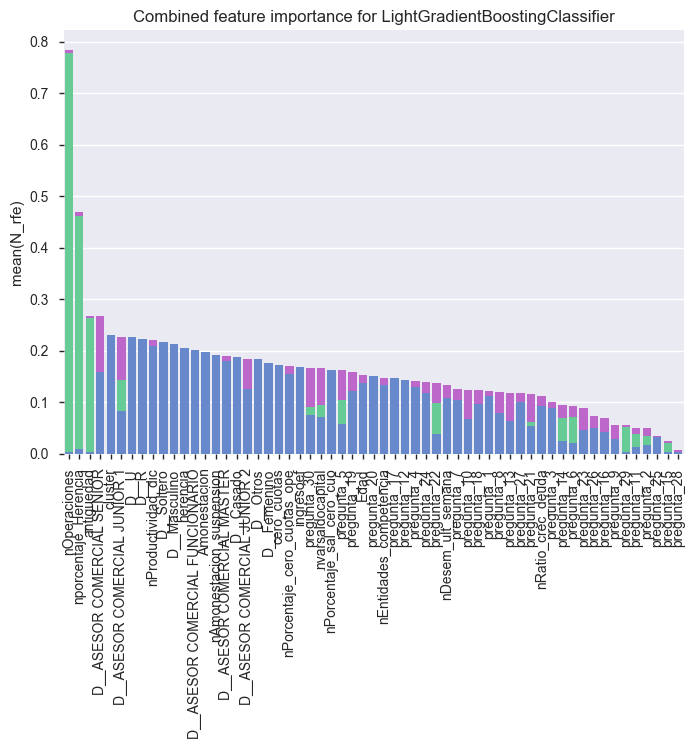

In [56]:
df1 = pd.DataFrame(model_results['lightgbm']['fe_entropy']).set_index(0)
df2 = pd.DataFrame(model_results['lightgbm']['fe_rfe']).set_index(0)

df1 = df1.T
df1

for feature in [col for col in df1.columns if col.startswith('D_')]:
    df1 = df1.rename(columns={
        feature: feature.replace('_', ' ').replace('D  ', 'D__')
    })

df1 = df1.T
    
results_lightgbm = pd.concat([df1, df2], axis=1)

results_lightgbm.columns = ['entropy', 'rfe']
results_lightgbm['N_entropy'] = normalize(results_lightgbm['entropy'])[0]
results_lightgbm['N_rfe'] = normalize(results_lightgbm['rfe'])[0]

results_lightgbm['score'] = results_lightgbm['N_entropy'] + results_lightgbm['N_rfe']

results_lightgbm = results_lightgbm.sort_values('score', ascending=False)

results_lightgbm

plt.title('Combined feature importance for LightGradientBoostingClassifier')
sns.barplot(x=results_lightgbm.index, y=results_lightgbm['score'], color=sns.color_palette("hls", 5)[4])
sns.barplot(x=results_lightgbm.index, y=results_lightgbm['N_entropy'], color=sns.color_palette("hls", 5)[2])
sns.barplot(x=results_lightgbm.index, y=results_lightgbm['N_rfe'], color=sns.color_palette("hls", 5)[3])
plt.xticks(rotation=90)

,extra_trees,random_forest,lightgbm,score
nOperaciones,0.428473,0.426776,0.782943,1.638193
nporcentaje_Herencia,0.222916,0.303991,0.470026,0.996933
D__ASESOR COMERCIAL SENIOR,0.279179,0.227824,0.266856,0.773859
D__ASESOR COMERCIAL JUNIOR 1,0.314064,0.181553,0.226849,0.722466
D__R,0.287347,0.208362,0.222024,0.717733
antiguedad,0.155411,0.285091,0.268199,0.708701
nProductividad_dic,0.288277,0.198879,0.221256,0.708412
D__ASESOR COMERCIAL MASTER,0.285363,0.232541,0.188982,0.706886
herencia,0.299737,0.201606,0.205267,0.706610
cluster,0.233643,0.238382,0.230402,0.702427


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58]),
 <a list of 59 Text xticklabel objects>)

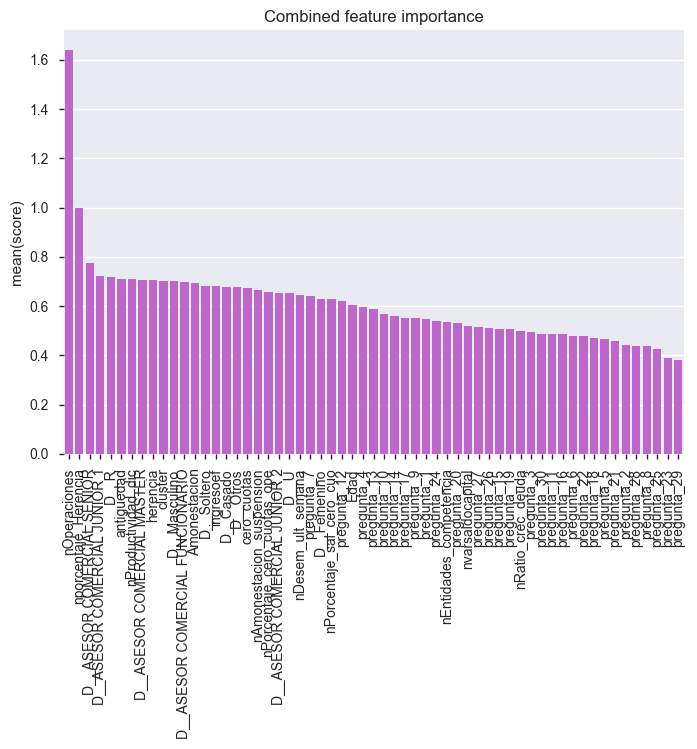

In [57]:
df_results = pd.concat([results_extra_trees['score'], results_random_forest['score'], results_lightgbm['score']], axis=1)
df_results.columns = ['extra_trees', 'random_forest', 'lightgbm']
df_results['score'] = df_results['extra_trees'] + df_results['random_forest'] + df_results['lightgbm']

df_results = df_results.sort_values('score', ascending=False)

df_results

plt.title('Combined feature importance')
sns.barplot(x=df_results.index, y=df_results['score'], color=sns.color_palette("hls", 5)[4])
plt.xticks(rotation=90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58]),
 <a list of 59 Text xticklabel objects>)

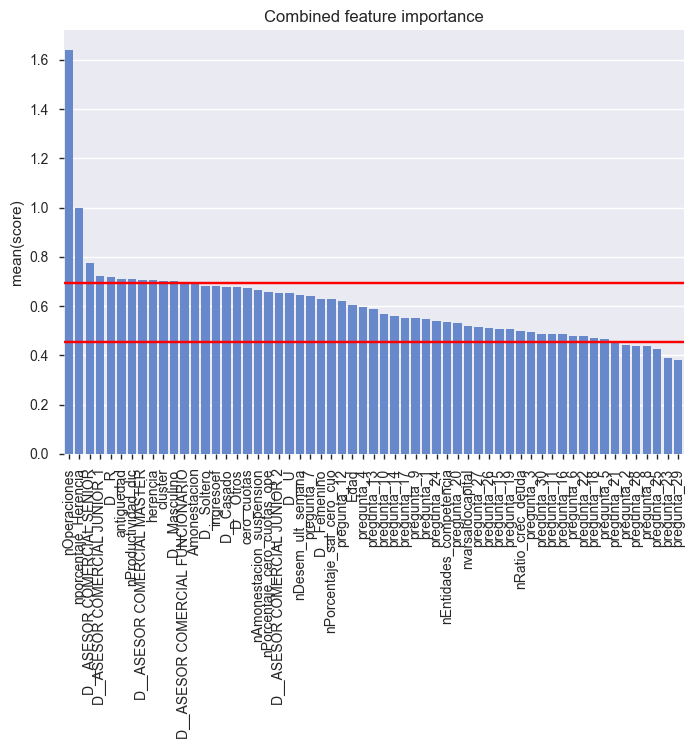

In [58]:
margin1 = 0.1
margin2 = 0.8

plt.title('Combined feature importance')
sns.barplot(x=df_results.index, y=df_results['score'], color=sns.color_palette("hls", 5)[3])
plt.xticks(rotation=90)
sns.plt.axhline(df_results['score'].quantile(margin1), color='r')
sns.plt.axhline(df_results['score'].quantile(margin2), color='r')

In [59]:
categories = ['bad', 'uncertain', 'good']
cuts = [
    min(df_results['score']), 
    df_results['score'].quantile(margin1), 
    df_results['score'].quantile(margin2), 
    max(df_results['score'])
]
df_results['score'] = pd.cut(df_results['score'], cuts, labels=categories, include_lowest=True)
df_results['score']

nOperaciones                            good
nporcentaje_Herencia                    good
D__ASESOR COMERCIAL SENIOR              good
D__ASESOR COMERCIAL JUNIOR 1            good
D__R                                    good
antiguedad                              good
nProductividad_dic                      good
D__ASESOR COMERCIAL MASTER              good
herencia                                good
cluster                                 good
D__Masculino                            good
D__ASESOR COMERCIAL FUNCIONARIO         good
Amonestacion                       uncertain
D__Soltero                         uncertain
ingresoef                          uncertain
D__Casado                          uncertain
D__Otros                           uncertain
cero_cuotas                        uncertain
nAmonestacion_suspension           uncertain
nPorcentaje_cero_cuotas_ope        uncertain
D__ASESOR COMERCIAL JUNIOR 2       uncertain
D__U                               uncertain
nDesem_ult

In [60]:
df_results.to_csv('hk2_initial_pass_results.csv')

In [61]:
uncertain_features = list(df_results.loc[df_results['score'] == 'uncertain'].T.columns)

In [62]:
with open('hk2_uncertain_features.txt', 'wb') as fp:
    pickle.dump(uncertain_features, fp)